In [1]:
!pip install linearmodels

In [2]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import wbdata
import numpy as np
import pycountry
import plotly.express as px
import statsmodels.api as sm
import statsmodels.formula.api as smf  # For statistical modeling using R-style formulas
from linearmodels.panel import PanelOLS
from statsmodels.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

# **CATTLE**

In [4]:
filepath = 'https://raw.githubusercontent.com/ZeliaDec/DataScience/main/Data/'

In [5]:
last_df = pd.read_csv("DataScience/Data/Database.csv")

In [6]:
last_df.keys()

Index(['country', 'year', 'landArea', 'iso3', 'Total Size Cornfield in ha',
       'corn', 'corn1992', 'forest', 'suitability', '% Land available',
       'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 'bci_bci',
       'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr'],
      dtype='object')

In [7]:
cattle = pd.read_csv('cattle.csv', delimiter=';')
cattle.head(24)

,country,year,Number of Cattle
0,Afghanistan,2000,700000
1,Afghanistan,2001,600000
2,Afghanistan,2002,833000
3,Afghanistan,2003,761000
4,Afghanistan,2004,829000
5,Afghanistan,2005,784000
6,Afghanistan,2006,651700
7,Afghanistan,2007,761100
8,Afghanistan,2008,739000
9,Afghanistan,2009,750000


In [8]:
value_counts_per_area = cattle.groupby("country")["Number of Cattle"].count()

# Filter to get only the areas where the count is not equal to 22
areas_not_equal_to_22 = value_counts_per_area[value_counts_per_area < 22].index
areas_not_equal_to_22

Index(['French Guiana', 'Guadeloupe', 'Martinique', 'Montenegro', 'Réunion',
       'Serbia', 'Serbia and Montenegro', 'South Sudan', 'Sudan',
       'Sudan (former)'],
      dtype='object', name='country')

In [9]:
cattle = cattle[~cattle["country"].isin(areas_not_equal_to_22)]
cattle

,country,year,Number of Cattle
0,Afghanistan,2000,700000
1,Afghanistan,2001,600000
2,Afghanistan,2002,833000
3,Afghanistan,2003,761000
4,Afghanistan,2004,829000
...,...,...,...
4444,Zimbabwe,2018,2600000
4445,Zimbabwe,2019,2350000
4446,Zimbabwe,2020,2300000
4447,Zimbabwe,2021,2518655


In [10]:
# Function to get ISO-3 country code from country name
def get_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except LookupError:
        return None

In [11]:
# Lookup the country by ISO3 code
country = pycountry.countries.get(alpha_3='VAT')

# Display the country name
country.name

'Holy See (Vatican City State)'

In [12]:
country_mapping = {
    'United Republic of Tanzania': 'Tanzania',
    'United States of America': 'United States',
    'Venezuela, RB': 'Venezuela',
    'Bahamas, The': 'Bahamas',
    'Congo, Dem. Rep.':'Congo, The Democratic Republic of the',
    'Congo, Rep.': 'Congo',
    'Turkiye': 'Türkiye',
    "Cote d'Ivoire":"Côte d'Ivoire",
    'St. Lucia':'Saint Lucia',
    "Korea, Dem. People's Rep." : "Korea, Democratic People's Republic of",
    'Korea, Rep.': 'Korea, Republic of',
    'Lao PDR':"Lao People's Democratic Republic",
    'Gambia, The': 'Gambia',
    'Egypt, Arab Rep.': 'Egypt',
    'Iran, Islamic Rep.': 'Iran, Islamic Republic of',
    'St. Kitts and Nevis': 'Saint Kitts and Nevis',
    'St. Vincent and the Grenadines':'Saint Vincent and the Grenadines',
    'Micronesia, Fed. Sts.': 'Micronesia, Federated States of',
    'Virgin Islands (U.S.)':'Virgin Islands, U.S.',
    'Yemen, Rep.':'Yemen',
    'Macao SAR, China': 'Macao',
    'St. Martin (French part)':'Saint Martin (French part)',
    'Curacao':'Curaçao',
    'Hong Kong SAR, China': 'Hong Kong'
    # You can add more mappings if necessary
}

In [13]:
# Reverting to previous data before dropping and then manually resolving country mismatches
country_mapping_corn = {
    'Bolivia (Plurinational State of)':'Bolivia, Plurinational State of',
    'China, Taiwan Province of':'Taiwan, Province of China',
    'China': 'China_',
    'China, mainland':'China',
    'Democratic Republic of the Congo':'Congo, The Democratic Republic of the',
    'Iran (Islamic Republic of)':'Iran, Islamic Republic of',
    'Micronesia (Federated States of)': 'Micronesia, Federated States of',
    'Netherlands (Kingdom of the)':'Netherlands',
    'Republic of Korea': 'Korea, Republic of',
    'Venezuela (Bolivarian Republic of)':'Venezuela, Bolivarian Republic of',
    # You can add more mappings if necessary
}

cattle['country'] = cattle['country'].replace(country_mapping_corn)

In [14]:
country_not_country = [
    'Africa Eastern and Southern',
    'Africa Western and Central',
    'Central Europe and the Baltics',
    'Upper middle income',
    'East Asia & Pacific (IDA & IBRD countries)',
    'East Asia & Pacific',
    'East Asia & Pacific (excluding high income)',
    'Euro area',
    'Europe & Central Asia',
    'Europe & Central Asia (IDA & IBRD countries)',
    'Europe & Central Asia (excluding high income)',
    'European Union',
    'Fragile and conflict affected situations',
    'Heavily indebted poor countries (HIPC)',
    'Early-demographic dividend',
    'High income',
    'IBRD only',
    'IDA & IBRD total',
    'IDA blend',
    'IDA only',
    'IDA total',
    'Late-demographic dividend',
    'Latin America & Caribbean',
    'Latin America & Caribbean (excluding high income)',
    'Least developed countries: UN classification',
    'Low & middle income',
    'Lower middle income',
    'Middle East & North Africa',
    'Middle East & North Africa (IDA & IBRD countries)',
    'Middle income',
    'Low income',
    'North America',
    'OECD members',
    'Other small states',
    'Pacific island small states',
    'Post-demographic dividend',
    'Small states',
    'South Asia',
    'Sub-Saharan Africa (IDA & IBRD countries)',
    'Sub-Saharan Africa (excluding high income)',
    'Pre-demographic dividend',
    'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa',
    'West Bank and Gaza',
    'Caribbean small states',
    'Channel Islands',
    'Arab World',
    'Middle East & North Africa (excluding high income)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Eastern and Southern Africa',
    'Western and Central Africa',
    'Not classified',
    'World'
]


In [15]:
cattle['iso3'] = cattle['country'].apply(get_iso3)
cattle[cattle['iso3'].isnull()]

,country,year,Number of Cattle,iso3
782,China_,2000,32532541,None
783,China_,2001,33249286,None
784,China_,2002,34173375,None
785,China_,2003,36545418,None
786,China_,2004,38040782,None
...,...,...,...,...
3046,Palestine,2018,51327,None
3047,Palestine,2019,35969,None
3048,Palestine,2020,36092,None
3049,Palestine,2021,43958,None


In [16]:
cattle = cattle.dropna()
cattle = cattle.reset_index()
cattle.drop('index', axis=1, inplace=True)
cattle.rename(columns={'Number of Cattle':'cattle'}, inplace=True)
cattle.shape

(4209, 4)

In [17]:
final_merged_df = pd.merge(last_df, cattle, on=['iso3', 'country', 'year'], how='outer')
final_merged_df.dropna(inplace=True)
final_merged_df

,country,year,landArea,iso3,Total Size Cornfield in ha,corn,corn1992,forest,suitability,% Land available,price,temperature,Average_Temperature,gdp,rain,bci_bci,wdi_poprul,wdi_fdiin,wdi_gdpagr,cattle
23,Angola,2000.0,1246700.0,AGO,686853.0,6868.53,8470.00,744712.4,38156.83,0.030606,2.3175,0.205,21.854977,12207.354573,1010.0,66.76,49.91,8.782670e+10,32.0356,481000.0
24,Angola,2001.0,1246700.0,AGO,745169.0,7451.69,8470.00,745976.9,38156.83,0.030606,2.0900,0.290,21.870478,11948.601236,1010.0,66.71,48.73,2.145553e+11,66.5856,492000.0
25,Angola,2002.0,1246700.0,AGO,815428.0,8154.28,8470.00,746276.4,38156.83,0.030606,2.3575,0.717,22.064162,15285.592487,1010.0,66.76,47.54,1.744086e+11,34.1056,498000.0
26,Angola,2003.0,1246700.0,AGO,818445.0,8184.45,8470.00,747195.3,38156.83,0.030606,2.4600,0.912,22.212118,17812.704626,1010.0,66.71,46.35,3.576791e+11,38.4400,498000.0
27,Angola,2004.0,1246700.0,AGO,1067772.0,10677.72,8470.00,748742.9,38156.83,0.030606,2.0475,0.348,21.872386,23552.045850,1010.0,66.59,45.17,2.197407e+11,39.0625,425000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4290,Zambia,2017.0,743390.0,ZMB,1433944.0,14339.44,6613.05,473443.9,16982.08,0.022844,3.5075,0.579,21.990675,25895.263867,1020.0,58.19,57.02,1.107390e+11,16.1604,1300000.0
4291,Zambia,2018.0,743390.0,ZMB,1086006.0,10860.06,6613.05,473059.8,16982.08,0.022844,3.7500,0.998,22.302766,26311.984274,1020.0,57.68,56.48,4.078284e+10,11.1556,1128763.0
4292,Zambia,2019.0,743390.0,ZMB,841693.0,8416.93,6613.05,471995.7,16982.08,0.022844,3.8775,1.349,22.617600,23310.346721,1020.0,57.25,55.93,5.477537e+10,8.1796,1163320.0
4293,Zambia,2020.0,743390.0,ZMB,1333519.0,13335.19,6613.05,471548.3,16982.08,0.022844,4.8400,1.386,22.167939,18063.780790,1020.0,56.95,55.37,2.448598e+10,8.8804,1107495.0


In [18]:
last_df = final_merged_df

In [19]:
last_df["logcorn"]= np.log(last_df["corn"])
last_df["logforest"]= np.log(last_df["forest"])
last_df["logland"]= np.log(last_df["landArea"])
last_df["loggdp"]= np.log(last_df['gdp'])
last_df['logsuit']= np.log(last_df['suitability'])
last_df['hetero']= last_df['hetero'] = last_df['suitability'].apply(lambda val: 1 if (val>last_df['suitability'].median()) else 0)

C:\Users\simon\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [20]:
last_df[last_df['logsuit'] < 0]

,country,year,landArea,iso3,Total Size Cornfield in ha,corn,corn1992,forest,suitability,% Land available,...,wdi_poprul,wdi_fdiin,wdi_gdpagr,cattle,logcorn,logforest,logland,loggdp,logsuit,hetero
1172,Egypt,2000.0,995450.0,EGY,843029.0,8430.29,8262.97,271.1,0.0,0.0,...,57.20,1.237998e+11,241.4916,1478000.0,9.039586,5.602488,13.810950,11.468803,-inf,0
1173,Egypt,2001.0,995450.0,EGY,873035.0,8730.35,8262.97,293.1,0.0,0.0,...,57.16,5.124286e+10,235.6225,1427000.0,9.074561,5.680514,13.810950,11.415581,-inf,0
1174,Egypt,2002.0,995450.0,EGY,828132.0,8281.32,8262.97,309.5,0.0,0.0,...,57.11,6.471101e+10,237.1600,1145000.0,9.021758,5.734958,13.810950,11.368151,-inf,0
1175,Egypt,2003.0,995450.0,EGY,834103.0,8341.03,8262.97,326.8,0.0,0.0,...,57.06,2.408654e+10,233.7841,1149000.0,9.028942,5.789348,13.810950,11.212853,-inf,0
1176,Egypt,2004.0,995450.0,EGY,788520.0,7885.20,8262.97,346.9,0.0,0.0,...,57.02,1.252641e+11,203.6329,1187000.0,8.972743,5.849037,13.810950,11.279573,-inf,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3624,Slovenia,2017.0,20138.1,SVN,38290.0,382.90,612.20,12365.3,0.0,0.0,...,45.73,1.195292e+11,3.3856,120116.0,5.947774,9.422649,9.910369,10.791155,-inf,0
3625,Slovenia,2018.0,20136.4,SVN,37080.0,370.80,612.20,12346.6,0.0,0.0,...,45.46,1.538652e+11,5.0625,115760.0,5.915663,9.421136,9.910284,10.900028,-inf,0
3626,Slovenia,2019.0,20136.4,SVN,38880.0,388.80,612.20,12320.5,0.0,0.0,...,45.18,2.153712e+11,4.0401,116300.0,5.963065,9.419020,9.910284,10.903874,-inf,0
3627,Slovenia,2020.0,20136.4,SVN,39830.0,398.30,612.20,12293.9,0.0,0.0,...,44.88,5.051046e+10,4.3681,118120.0,5.987205,9.416858,9.910284,10.891811,-inf,0


In [21]:
last_df

,country,year,landArea,iso3,Total Size Cornfield in ha,corn,corn1992,forest,suitability,% Land available,...,wdi_poprul,wdi_fdiin,wdi_gdpagr,cattle,logcorn,logforest,logland,loggdp,logsuit,hetero
23,Angola,2000.0,1246700.0,AGO,686853.0,6868.53,8470.00,744712.4,38156.83,0.030606,...,49.91,8.782670e+10,32.0356,481000.0,8.834705,13.520753,14.036011,9.409794,10.549460,1
24,Angola,2001.0,1246700.0,AGO,745169.0,7451.69,8470.00,745976.9,38156.83,0.030606,...,48.73,2.145553e+11,66.5856,492000.0,8.916196,13.522450,14.036011,9.388369,10.549460,1
25,Angola,2002.0,1246700.0,AGO,815428.0,8154.28,8470.00,746276.4,38156.83,0.030606,...,47.54,1.744086e+11,34.1056,498000.0,9.006298,13.522851,14.036011,9.634666,10.549460,1
26,Angola,2003.0,1246700.0,AGO,818445.0,8184.45,8470.00,747195.3,38156.83,0.030606,...,46.35,3.576791e+11,38.4400,498000.0,9.009991,13.524082,14.036011,9.787667,10.549460,1
27,Angola,2004.0,1246700.0,AGO,1067772.0,10677.72,8470.00,748742.9,38156.83,0.030606,...,45.17,2.197407e+11,39.0625,425000.0,9.275915,13.526151,14.036011,10.066968,10.549460,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4290,Zambia,2017.0,743390.0,ZMB,1433944.0,14339.44,6613.05,473443.9,16982.08,0.022844,...,57.02,1.107390e+11,16.1604,1300000.0,9.570769,13.067789,13.518976,10.161815,9.739914,1
4291,Zambia,2018.0,743390.0,ZMB,1086006.0,10860.06,6613.05,473059.8,16982.08,0.022844,...,56.48,4.078284e+10,11.1556,1128763.0,9.292847,13.066977,13.518976,10.177780,9.739914,1
4292,Zambia,2019.0,743390.0,ZMB,841693.0,8416.93,6613.05,471995.7,16982.08,0.022844,...,55.93,5.477537e+10,8.1796,1163320.0,9.038000,13.064725,13.518976,10.056653,9.739914,1
4293,Zambia,2020.0,743390.0,ZMB,1333519.0,13335.19,6613.05,471548.3,16982.08,0.022844,...,55.37,2.448598e+10,8.8804,1107495.0,9.498162,13.063777,13.518976,9.801664,9.739914,1


# **Data Description**

In [23]:
last_df.keys()

Index(['country', 'year', 'landArea', 'iso3', 'Total Size Cornfield in ha',
       'corn', 'corn1992', 'forest', 'suitability', '% Land available',
       'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 'bci_bci',
       'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr', 'cattle', 'logcorn',
       'logforest', 'logland', 'loggdp', 'logsuit', 'hetero'],
      dtype='object')

In [24]:
print(last_df[['landArea', 'corn', 'forest', 'suitability', 'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 
        'bci_bci', 'logcorn', 'logforest', 'logland', 'loggdp', 'logsuit', 'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr']].describe())

           landArea           corn        forest    suitability        price  \
count  1.408000e+03    1408.000000  1.408000e+03    1408.000000  1408.000000   
mean   1.016149e+06   11067.449588  3.470290e+05   33733.822500     3.956591   
std    2.435107e+06   23067.990343  1.287310e+06   75680.032365     1.422461   
min    1.997000e+03       0.080000  7.710000e+01       0.000000     2.047500   
25%    8.787550e+04     582.895000  1.657162e+04    1040.745000     2.460000   
50%    2.609800e+05    3422.305000  4.759030e+04   11214.215000     3.890000   
75%    7.699425e+05   10346.352500  1.404026e+05   24684.012500     4.555000   
max    1.638139e+07  189843.000000  9.559230e+06  419387.940000     6.982500   

       temperature  Average_Temperature           gdp         rain  \
count  1408.000000          1408.000000  1.408000e+03  1408.000000   
mean      1.109363            18.657817  3.452549e+05  1099.183381   
std       0.540489             7.464996  6.672929e+05   729.632052   

In [25]:
print(last_df[['landArea', 'corn', 'forest', 'suitability', 'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 
        'bci_bci', 'logcorn', 'logforest', 'logland', 'loggdp', 'logsuit', 'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr']].skew())

landArea               4.673847
corn                   4.141340
forest                 6.127807
suitability            3.676341
price                  0.529796
temperature            0.482910
Average_Temperature   -0.525555
gdp                    2.932437
rain                   0.854128
bci_bci               -1.151817
logcorn               -1.490253
logforest             -0.350549
logland               -0.094071
loggdp                 0.090696
logsuit                     NaN
wdi_poprul             0.221171
wdi_fdiin              1.752294
wdi_gdpagr             2.402634
dtype: float64


C:\Users\simon\anaconda3\Lib\site-packages\pandas\core\nanops.py:1256: RuntimeWarning: invalid value encountered in subtract
  adjusted = values - mean


In [26]:
last_df['logsuit'] = last_df.groupby('country')['logsuit'].transform(lambda x: x.replace([-np.inf, np.nan], 0))

In [27]:
print(last_df[['country', 'landArea', 'corn', 'forest', 'suitability', 'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 
        'bci_bci', 'logcorn', 'logforest', 'logland', 'loggdp', 'logsuit', 'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr']].describe())

           landArea           corn        forest    suitability        price  \
count  1.408000e+03    1408.000000  1.408000e+03    1408.000000  1408.000000   
mean   1.016149e+06   11067.449588  3.470290e+05   33733.822500     3.956591   
std    2.435107e+06   23067.990343  1.287310e+06   75680.032365     1.422461   
min    1.997000e+03       0.080000  7.710000e+01       0.000000     2.047500   
25%    8.787550e+04     582.895000  1.657162e+04    1040.745000     2.460000   
50%    2.609800e+05    3422.305000  4.759030e+04   11214.215000     3.890000   
75%    7.699425e+05   10346.352500  1.404026e+05   24684.012500     4.555000   
max    1.638139e+07  189843.000000  9.559230e+06  419387.940000     6.982500   

       temperature  Average_Temperature           gdp         rain  \
count  1408.000000          1408.000000  1.408000e+03  1408.000000   
mean      1.109363            18.657817  3.452549e+05  1099.183381   
std       0.540489             7.464996  6.672929e+05   729.632052   

# **Data Exploration Visual**

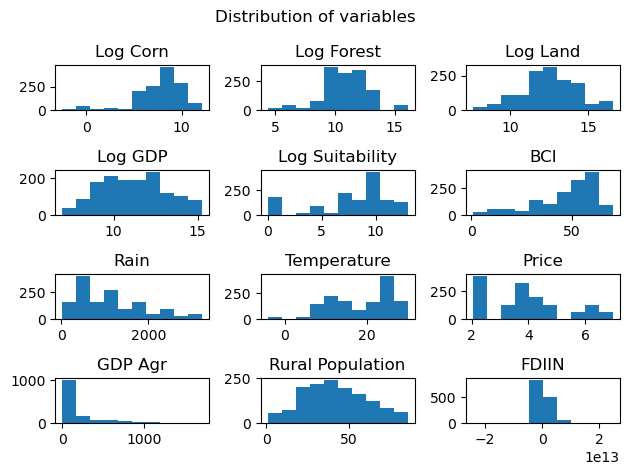

In [29]:
fig, axs = plt.subplots(4,3)

fig.suptitle('Distribution of variables')

# Log Corn
axs[0, 0].set_title('Log Corn')
axs[0, 0].hist(last_df['logcorn'])

# Log Forest
axs[0, 1].set_title('Log Forest')
axs[0, 1].hist(last_df['logforest'])

# Log Land
axs[0, 2].set_title('Log Land')
axs[0, 2].hist(last_df['logland'])

# Log GDP
axs[1, 0].set_title('Log GDP')
axs[1, 0].hist(last_df['loggdp'])

# Log Suitability
axs[1, 1].set_title('Log Suitability')
axs[1, 1].hist(last_df['logsuit'])

# BCI
axs[1, 2].set_title('BCI')
axs[1, 2].hist(last_df['bci_bci'])

# Rain
axs[2, 0].set_title('Rain')
axs[2, 0].hist(last_df['rain'])

# Temperature
axs[2, 1].set_title('Temperature')
axs[2, 1].hist(last_df['Average_Temperature'])

# Price
axs[2, 2].set_title('Price')
axs[2, 2].hist(last_df['price'])

# Rural Population
axs[3, 0].set_title('GDP Agr')
axs[3, 0].hist(last_df['wdi_gdpagr'])

# Rural Population
axs[3, 1].set_title('Rural Population')
axs[3, 1].hist(last_df['wdi_poprul'])

# Rural Population
axs[3, 2].set_title('FDIIN')
axs[3, 2].hist(last_df['wdi_fdiin'])

plt.tight_layout()
plt.show()

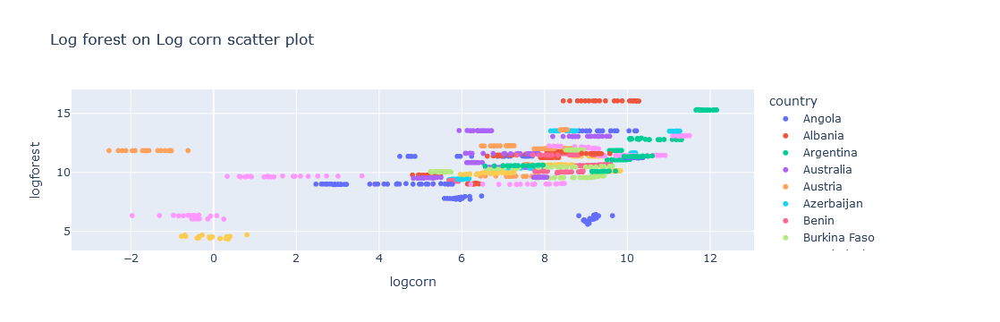

In [30]:
fig = px.scatter(last_df,
           x='logcorn', 
           y='logforest', 
           color='country', 
           hover_name='country',
           title='Log forest on Log corn scatter plot')
fig.show()

In [31]:
#Dummy for the heterogeneity variable
# Finding the median of Land_Size
initial_hetero_var = last_df['suitability']
median_suitable_land = initial_hetero_var.median()
median_suitable_land
# Creating a dummy variable for whether the land size is higher than the median
last_df['hetero'] = last_df['suitability'].apply(lambda val: 1 if (val>=last_df['suitability'].median()) else 0)

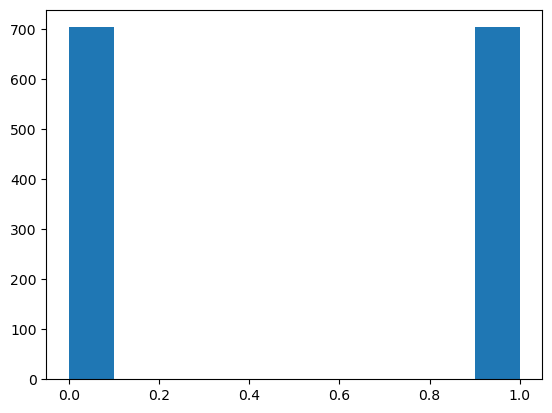

In [32]:
plt.figure()

plt.hist(last_df['hetero'])

plt.show()

<Figure size 640x480 with 0 Axes>

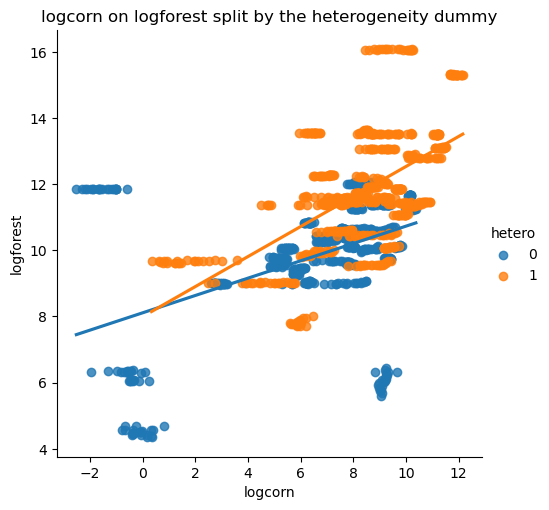

In [33]:
plt.figure()

sns.lmplot(data=last_df,
          x='logcorn',
          y='logforest',
          hue='hetero',
          ci=None)

plt.title('logcorn on logforest split by the heterogeneity dummy')
plt.show()

# **Functional Form tests**

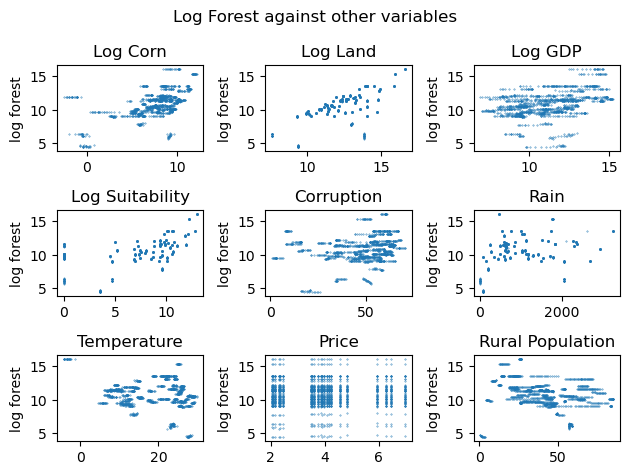

In [35]:
fig, axs = plt.subplots(3,3)

fig.suptitle('Log Forest against other variables')

# Log Corn
axs[0, 0].set_title('Log Corn')
axs[0, 0].scatter(last_df['logcorn'], last_df['logforest'], s=0.1)
axs[0, 0].set_ylabel('log forest')
#axs[0, 0].set_xlabel('log corn')


# Log Land
axs[0, 1].set_title('Log Land')
axs[0, 1].scatter(last_df['logland'], last_df['logforest'], s=0.1)
axs[0, 1].set_ylabel('log forest')
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
axs[0, 2].scatter(last_df['loggdp'], last_df['logforest'], s=0.1)
axs[0, 2].set_ylabel('log forest')
#axs[0, 2].set_xlabel('log gdp')

# Log Suitability
axs[1, 0].set_title('Log Suitability')
axs[1, 0].scatter(last_df['logsuit'], last_df['logforest'], s=0.1)
axs[1, 0].set_ylabel('log forest')
#axs[1, 0].set_xlabel('log suitability')

# BCI
axs[1, 1].set_title('Corruption')
axs[1, 1].scatter(last_df['bci_bci'], last_df['logforest'], s=0.1)
axs[1, 1].set_ylabel('log forest')
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 2].set_title('Rain')
axs[1, 2].scatter(last_df['rain'], last_df['logforest'], s=0.1)
axs[1, 2].set_ylabel('log forest')
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[2, 0].set_title('Temperature')
axs[2, 0].scatter(last_df['Average_Temperature'], last_df['logforest'], s=0.1)
axs[2, 0].set_ylabel('log forest')
#axs[2, 0].set_xlabel('temperature')

# Price
axs[2, 1].set_title('Price')
axs[2, 1].scatter(last_df['price'], last_df['logforest'], s=0.1)
axs[2, 1].set_ylabel('log forest')
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[2, 2].set_title('Rural Population')
axs[2, 2].scatter(last_df['wdi_poprul'], last_df['logforest'], s=0.1)
axs[2, 2].set_ylabel('log forest')
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

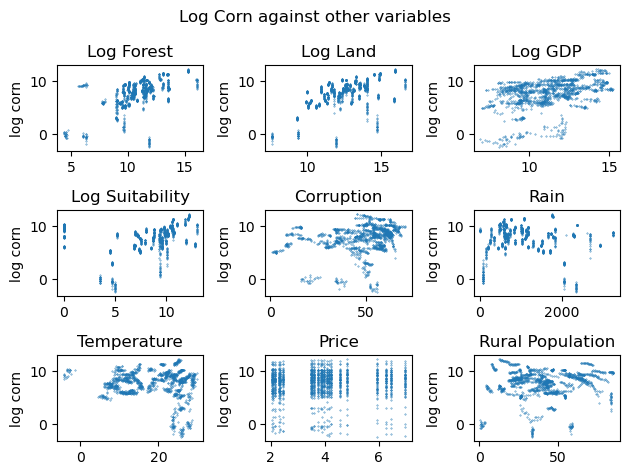

In [36]:
fig, axs = plt.subplots(3,3)

fig.suptitle('Log Corn against other variables')

# Log Corn
axs[0, 0].set_title('Log Forest')
axs[0, 0].scatter(last_df['logforest'], last_df['logcorn'], s=0.1)
axs[0, 0].set_ylabel('log corn')
#axs[0, 0].set_xlabel('log corn')


# Log Land
axs[0, 1].set_title('Log Land')
axs[0, 1].scatter(last_df['logland'], last_df['logcorn'], s=0.1)
axs[0, 1].set_ylabel('log corn')
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
axs[0, 2].scatter(last_df['loggdp'], last_df['logcorn'], s=0.1)
axs[0, 2].set_ylabel('log corn')
#axs[0, 2].set_xlabel('log gdp')

# Log Suitability
axs[1, 0].set_title('Log Suitability')
axs[1, 0].scatter(last_df['logsuit'], last_df['logcorn'], s=0.1)
axs[1, 0].set_ylabel('log corn')
#axs[1, 0].set_xlabel('log suitability')

# BCI
axs[1, 1].set_title('Corruption')
axs[1, 1].scatter(last_df['bci_bci'], last_df['logcorn'], s=0.1)
axs[1, 1].set_ylabel('log corn')
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 2].set_title('Rain')
axs[1, 2].scatter(last_df['rain'], last_df['logcorn'], s=0.1)
axs[1, 2].set_ylabel('log corn')
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[2, 0].set_title('Temperature')
axs[2, 0].scatter(last_df['Average_Temperature'], last_df['logcorn'], s=0.1)
axs[2, 0].set_ylabel('log corn')
#axs[2, 0].set_xlabel('temperature')

# Price
axs[2, 1].set_title('Price')
axs[2, 1].scatter(last_df['price'], last_df['logcorn'], s=0.1)
axs[2, 1].set_ylabel('log corn')
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[2, 2].set_title('Rural Population')
axs[2, 2].scatter(last_df['wdi_poprul'], last_df['logcorn'], s=0.1)
axs[2, 2].set_ylabel('log corn')
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

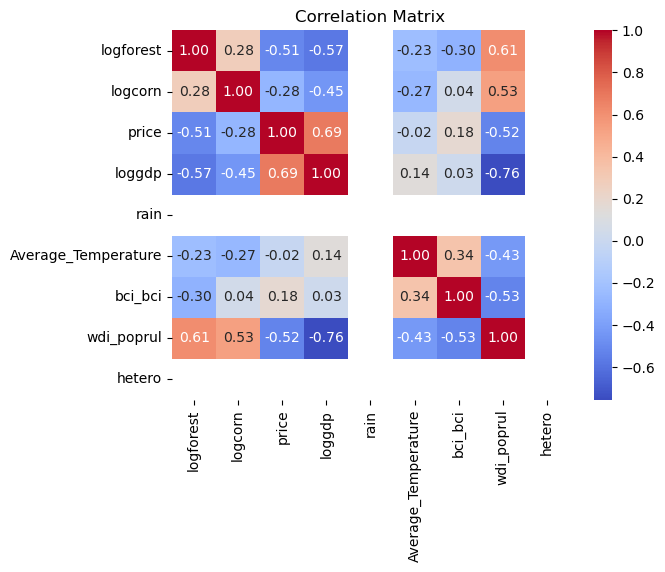

In [37]:
# Combine independent variables and dependent variable for the correlation matrix
variables = last_df[last_df['country'] == 'France'][['logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 
               'bci_bci', 'wdi_poprul', 'hetero']]

# Compute the correlation matrix
correlation_matrix = variables.corr()

# Display the correlation matrix
#print("Correlation Matrix:")
#print(correlation_matrix)

# Visualize the correlation matrix using a heatmap
plt.figure()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()


In [38]:
last_df[last_df['country'] == 'Brazil']['rain']

506    1782.0
507    1782.0
508    1761.0
509    1782.0
510    1782.0
511    1782.0
512    1782.0
513    1761.0
514    1761.0
515    1761.0
516    1761.0
517    1761.0
518    1761.0
519    1761.0
520    1761.0
521    1761.0
522    1761.0
523    1761.0
524    1761.0
525    1761.0
526    1761.0
527    1761.0
Name: rain, dtype: float64

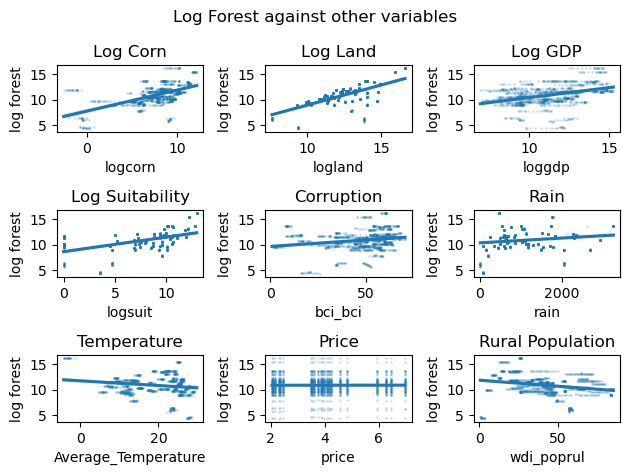

In [39]:
fig, axs = plt.subplots(3,3)

fig.suptitle('Log Forest against other variables')

# Log Corn
axs[0, 0].set_title('Log Corn')
sns.regplot(ax=axs[0, 0], x=last_df['logcorn'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 0].set_ylabel('log forest')
#axs[0, 0].set_xlabel('log corn')


# Log Land
axs[0, 1].set_title('Log Land')
sns.regplot(ax=axs[0, 1], x=last_df['logland'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 1].set_ylabel('log forest')
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
sns.regplot(ax=axs[0, 2], x=last_df['loggdp'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 2].set_ylabel('log forest')
#axs[0, 2].set_xlabel('log gdp')

# Log Suitability
axs[1, 0].set_title('Log Suitability')
sns.regplot(ax=axs[1, 0], x=last_df['logsuit'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 0].set_ylabel('log forest')
#axs[1, 0].set_xlabel('log suitability')

# BCI
axs[1, 1].set_title('Corruption')
sns.regplot(ax=axs[1, 1], x=last_df['bci_bci'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 1].set_ylabel('log forest')
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 2].set_title('Rain')
sns.regplot(ax=axs[1, 2], x=last_df['rain'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 2].set_ylabel('log forest')
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[2, 0].set_title('Temperature')
sns.regplot(ax=axs[2, 0], x=last_df['Average_Temperature'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 0].set_ylabel('log forest')
#axs[2, 0].set_xlabel('temperature')

# Price
axs[2, 1].set_title('Price')
sns.regplot(ax=axs[2, 1], x=last_df['price'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 1].set_ylabel('log forest')
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[2, 2].set_title('Rural Population')
sns.regplot(ax=axs[2, 2], x=last_df['wdi_poprul'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 2].set_ylabel('log forest')
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

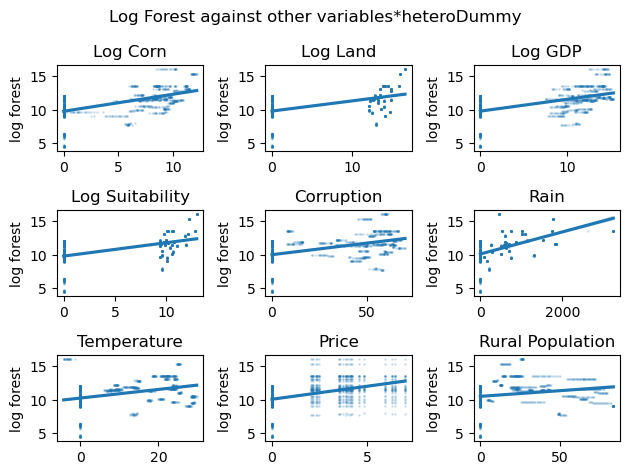

In [40]:
fig, axs = plt.subplots(3,3)

fig.suptitle('Log Forest against other variables*heteroDummy')

# Log Corn
axs[0, 0].set_title('Log Corn')
sns.regplot(ax=axs[0, 0], x=last_df['logcorn']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 0].set_ylabel('log forest')
#axs[0, 0].set_xlabel('log corn')


# Log Land
axs[0, 1].set_title('Log Land')
sns.regplot(ax=axs[0, 1], x=last_df['logland']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 1].set_ylabel('log forest')
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
sns.regplot(ax=axs[0, 2], x=last_df['loggdp']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[0, 2].set_ylabel('log forest')
#axs[0, 2].set_xlabel('log gdp')

# Log Suitability
axs[1, 0].set_title('Log Suitability')
sns.regplot(ax=axs[1, 0], x=last_df['logsuit']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 0].set_ylabel('log forest')
#axs[1, 0].set_xlabel('log suitability')

# BCI
axs[1, 1].set_title('Corruption')
sns.regplot(ax=axs[1, 1], x=last_df['bci_bci']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 1].set_ylabel('log forest')
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 2].set_title('Rain')
sns.regplot(ax=axs[1, 2], x=last_df['rain']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[1, 2].set_ylabel('log forest')
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[2, 0].set_title('Temperature')
sns.regplot(ax=axs[2, 0], x=last_df['Average_Temperature']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 0].set_ylabel('log forest')
#axs[2, 0].set_xlabel('temperature')

# Price
axs[2, 1].set_title('Price')
sns.regplot(ax=axs[2, 1], x=last_df['price']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 1].set_ylabel('log forest')
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[2, 2].set_title('Rural Population')
sns.regplot(ax=axs[2, 2], x=last_df['wdi_poprul']*last_df['hetero'], y=last_df['logforest'], scatter_kws={'s': 1, 'alpha': 0.15})
axs[2, 2].set_ylabel('log forest')
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

In [41]:
fig = px.scatter(last_df,
           x='corn', 
           y='forest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','logcorn','logforest'],
           title='Log forest on Log corn scatter plot')

fig.show()

In [42]:
fig = px.scatter(last_df,
           x='logland', 
           y='logforest', 
           color='country', 
           hover_name='country',
           title='Log forest on Log land scatter plot')

fig.show()

In [43]:
fig = px.scatter(last_df,
           x='logsuit', 
           y='logforest', 
           color='country', 
           hover_name='country',
           title='Log forest on Log suitability scatter plot')

fig.show()

In [44]:
fig = px.scatter(last_df,
           x='loggdp', 
           y='logforest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','loggdp','logforest'],
           title='Log forest on Log GDP scatter plot')

fig.show()

In [45]:
fig = px.scatter(last_df,
           x='bci_bci', 
           y='logforest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','bci_bci','logforest'],
           title='Log forest on Corruption scatter plot')

fig.show()

In [46]:
fig = px.scatter(last_df,
           x='rain', 
           y='logforest', 
           color='country', 
           hover_name='country',
           title='Log forest on Rain scatter plot')

fig.show()

In [47]:
fig = px.scatter(last_df,
           x='Average_Temperature', 
           y='logforest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','Average_Temperature','logforest'],
           title='Log forest on Temperature scatter plot')

fig.show()

In [48]:
fig = px.scatter(last_df,
           x='price', 
           y='logforest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','price','logforest'],
           title='Log forest on price scatter plot')

fig.show()

In [49]:
fig = px.scatter(last_df,
           x='wdi_poprul', 
           y='logforest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','wdi_poprul','logforest'],
           title='Log forest on Rural Population scatter plot')

fig.show()

In [50]:
fig = px.scatter(last_df,
           x='cattle', 
           y='forest', 
           color='country', 
           hover_name='country',
           hover_data=['country','year','cattle'],
           title='Forest on cattle scatter plot')

fig.show()

In [51]:
datas = last_df.groupby('year')[['forest','logforest', 'corn','logcorn','gdp','loggdp','rain', 'price','Average_Temperature','bci_bci','wdi_poprul']].mean()

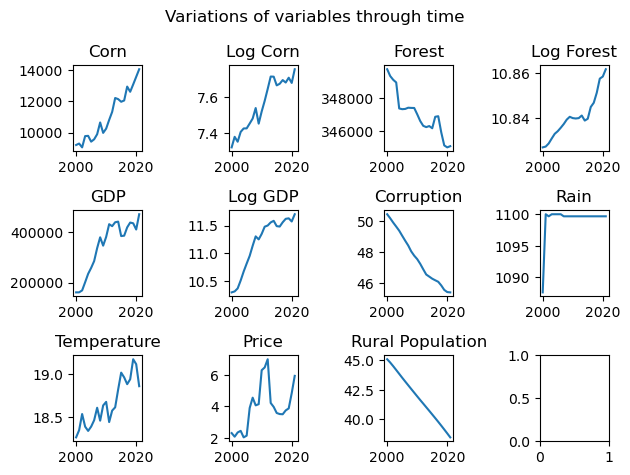

In [52]:
fig, axs = plt.subplots(3,4)

fig.suptitle('Variations of variables through time')

# Corn
axs[0, 0].set_title('Corn')
axs[0, 0].plot(datas['corn'])
#axs[0, 0].set_xlabel('log corn')

# Log Corn
axs[0, 1].set_title('Log Corn')
axs[0, 1].plot(datas['logcorn'])
#axs[0, 0].set_xlabel('log corn') 

# Forest
axs[0, 2].set_title('Forest')
axs[0, 2].plot(datas['forest'])
#axs[0, 1].set_xlabel('log land')

# Log Forest
axs[0, 3].set_title('Log Forest')
axs[0, 3].plot(datas['logforest'])
#axs[0, 1].set_xlabel('log land')

# GDP
axs[1, 0].set_title('GDP')
axs[1, 0].plot(datas['gdp'])
#axs[0, 2].set_xlabel('log gdp')

# Log GDP
axs[1, 1].set_title('Log GDP')
axs[1, 1].plot(datas['loggdp'])
#axs[0, 2].set_xlabel('log gdp')

# BCI
axs[1, 2].set_title('Corruption')
axs[1, 2].plot(datas['bci_bci'])
#axs[1, 1].set_xlabel('corruption')

# Rain
axs[1, 3].set_title('Rain')
axs[1, 3].plot(datas['rain'])
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[2, 0].set_title('Temperature')
axs[2, 0].plot(datas['Average_Temperature'])
#axs[2, 0].set_xlabel('temperature')

# Price
axs[2, 1].set_title('Price')
axs[2, 1].plot(datas['price'])
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[2, 2].set_title('Rural Population')
axs[2, 2].plot(datas['wdi_poprul'])
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

# **SLR**

In [54]:
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
slr_resid = result.resids
slr_fit = result.fitted_values
print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.3169
Estimator:                   PanelOLS   R-squared (Between):              0.3230
No. Observations:                1408   R-squared (Within):              -11.866
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.3169
Time:                        13:32:32   Log-likelihood                   -2663.2
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      652.30
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(1,1406)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             11.287
                            

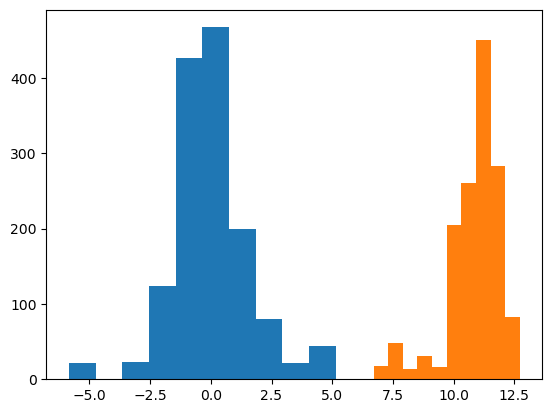

Skewness of SLR Residuals 0.18637795683094474


In [55]:
plt.figure()

plt.hist(slr_resid)
plt.hist(slr_fit)
plt.show()

print('Skewness of SLR Residuals', slr_resid.skew())

# **MLR**

In [57]:
print(last_df.keys())

Index(['country', 'year', 'landArea', 'iso3', 'Total Size Cornfield in ha',
       'corn', 'corn1992', 'forest', 'suitability', '% Land available',
       'price', 'temperature', 'Average_Temperature', 'gdp', 'rain', 'bci_bci',
       'wdi_poprul', 'wdi_fdiin', 'wdi_gdpagr', 'cattle', 'logcorn',
       'logforest', 'logland', 'loggdp', 'logsuit', 'hetero'],
      dtype='object')


In [58]:
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + loggdp + price + Average_Temperature + rain + wdi_poprul + rain + bci_bci + wdi_poprul",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
mlr_resid = result.resids
mlr_fit = result.fitted_values

print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.5121
Estimator:                   PanelOLS   R-squared (Between):              0.5203
No. Observations:                1408   R-squared (Within):              -15.976
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.5121
Time:                        13:32:33   Log-likelihood                   -2426.3
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      209.92
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(7,1400)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             11.025
                            

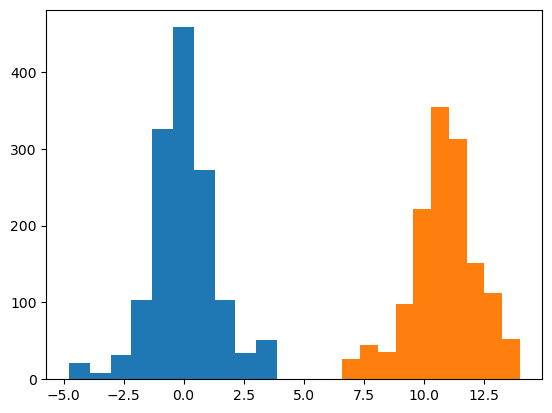

Skewness of MLR Residuals 0.05061795685772553


In [59]:
plt.figure()

plt.hist(mlr_resid)
plt.hist(mlr_fit)

plt.show()

print('Skewness of MLR Residuals', mlr_resid.skew())

In [60]:
last_df['logsuit'].describe()

count    1408.000000
mean        7.851131
std         3.574301
min         0.000000
25%         6.946312
50%         9.324931
75%        10.113429
max        12.946552
Name: logsuit, dtype: float64

In [61]:
# Create the design matrix (independent variables including constant)
X = sm.add_constant(last_df[['logcorn', 'logland', 'loggdp', 'price', 'Average_Temperature', 'rain', 'bci_bci', 'logsuit', 'wdi_poprul']])  # Add other predictors if necessary

# Calculate VIF for each predictor
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif)

              Variable         VIF
0                const  150.320594
1              logcorn    1.928141
2              logland    3.169470
3               loggdp    3.280451
4                price    1.058256
5  Average_Temperature    1.529122
6                 rain    1.361583
7              bci_bci    2.231747
8              logsuit    1.755113
9           wdi_poprul    1.748073


# **Fixed Effect**

In [63]:
last_df['country'] = last_df['country'].astype('category')
last_df['year'] = last_df['year'].astype('int')
print(last_df['country'].dtype, last_df['year'].dtype)

category int32


In [64]:
last_df[(last_df['country'] == 'Afghanistan') & (last_df['year'] == 2000)]

,country,year,landArea,iso3,Total Size Cornfield in ha,corn,corn1992,forest,suitability,% Land available,...,wdi_poprul,wdi_fdiin,wdi_gdpagr,cattle,logcorn,logforest,logland,loggdp,logsuit,hetero


In [65]:
fe = last_df[['country', 'year', 'forest', 'corn','iso3', 'price', 'Average_Temperature', 
              'hetero', 'logcorn', 'logforest', 'logland', 'loggdp', 'wdi_poprul', 'rain', 'logsuit', 'bci_bci']]
#fe['logcorn_hetero'] = fe['logcorn']*fe['hetero']
#fe['logcorn_hetero'] = fe['logcorn']**2

fe = fe.set_index(['country', 'year'])
fe.head(3)

forest     corn iso3   price  Average_Temperature  hetero  \
country year                                                                
Angola  2000  744712.4  6868.53  AGO  2.3175            21.854977       1   
        2001  745976.9  7451.69  AGO  2.0900            21.870478       1   
        2002  746276.4  8154.28  AGO  2.3575            22.064162       1   

               logcorn  logforest    logland    loggdp  wdi_poprul    rain  \
country year                                                                 
Angola  2000  8.834705  13.520753  14.036011  9.409794       49.91  1010.0   
        2001  8.916196  13.522450  14.036011  9.388369       48.73  1010.0   
        2002  9.006298  13.522851  14.036011  9.634666       47.54  1010.0   

               logsuit  bci_bci  
country year                     
Angola  2000  10.54946    66.76  
        2001  10.54946    66.71  
        2002  10.54946    66.76

In [66]:
Y = fe['logforest']
X = fe[['logcorn', 'price', 'Average_Temperature', 'loggdp', 'wdi_poprul', 'rain', 'bci_bci']]
X = add_constant(X)

In [67]:
# Wo time effects and wo logsuit and wo rain (variant in i only)
model = PanelOLS(dependent=Y, exog=X, entity_effects=False, time_effects=False, drop_absorbed=False)
results = model.fit()

fe_resid = results.resids

print(results, 'Skewness of residuals: ', fe_resid.skew())

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.5121
Estimator:                   PanelOLS   R-squared (Between):              0.5203
No. Observations:                1408   R-squared (Within):              -15.976
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.5121
Time:                        13:32:33   Log-likelihood                   -2426.3
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      209.92
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(7,1400)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             209.92
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

$LogForest_{it} = \beta_0 + \beta_1*LogCorn_{it} + \beta_2*LogGDP_{it} + \beta_3*Price_{t} + \beta_4*AverageTemp_{it} + \beta_6*RuralPop_{it} + \beta_7*CorruptionIndex_{it} + FE_i + \epsilon_{it}$

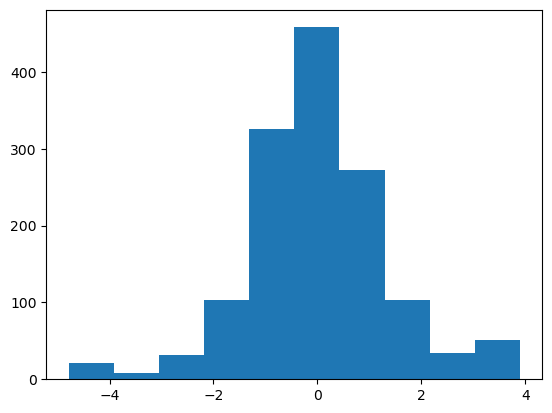

Residuals skewness:  0.05061795685772537


In [69]:
plt.figure()

plt.hist(fe_resid)

plt.show()

print('Residuals skewness: ', fe_resid.skew())

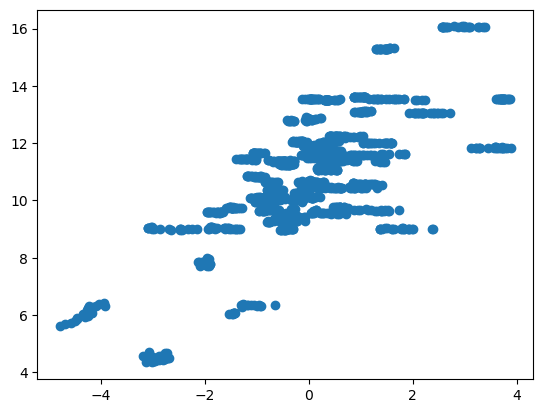

In [70]:
plt.figure()

plt.scatter(fe_resid, last_df['logforest'])

plt.show()

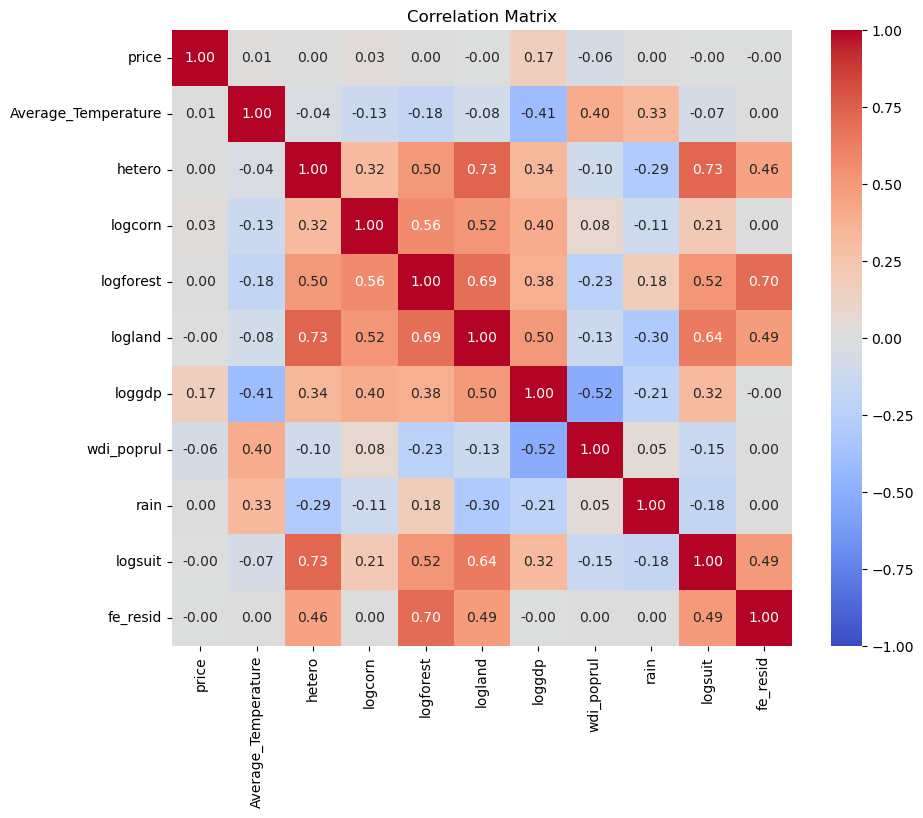

In [71]:
# Assuming 'fe_resid' is a Pandas Series, make sure it has the same length as the other variables.
# Combine all your variables into a single DataFrame
variables = pd.DataFrame({
    'price': last_df['price'],
    'Average_Temperature': last_df['Average_Temperature'],
    'hetero': last_df['hetero'],
    'logcorn': last_df['logcorn'],
    'logforest': last_df['logforest'],
    'logland': last_df['logland'],
    'loggdp': last_df['loggdp'],
    'wdi_poprul': last_df['wdi_poprul'],
    'rain': last_df['rain'],
    'logsuit': last_df['logsuit'],
    'fe_resid': fe_resid.values  # Assuming 'fe_resid' is a Pandas Series with the same index
})

# Compute the correlation matrix
correlation_matrix = variables.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

# **FIXED EFFECTS 2.0**

In [73]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + price + Average_Temperature + loggdp + wdi_poprul + rain + bci_bci + EntityEffects",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.0616
Estimator:                   PanelOLS   R-squared (Between):              0.0072
No. Observations:                1408   R-squared (Within):               0.0616
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.0073
Time:                        13:32:35   Log-likelihood                    2466.4
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      12.545
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(7,1337)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             3.0888
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

<Axes: xlabel='logcorn', ylabel='logforest'>

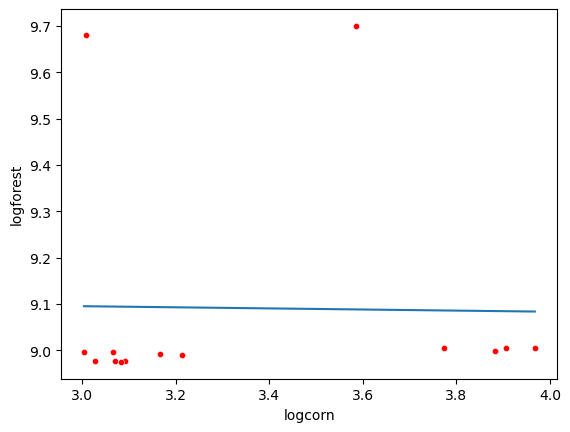

In [74]:
# subset
df_plot = last_df[(last_df["logcorn"] > 3) & (last_df["logcorn"] < 4)].copy()

# estimate ols and store fitted values
est_ols = sm.OLS.from_formula("logforest ~ logcorn", data=df_plot).fit()
df_plot["fitted_values"] = est_ols.fittedvalues

# plot observations
sns.scatterplot(x='logcorn', y='logforest', data=df_plot, color = "r", s = 20)

# plot ols fit line (crossing fitted values)
sns.lineplot(x='logcorn', y='fitted_values', data=df_plot)

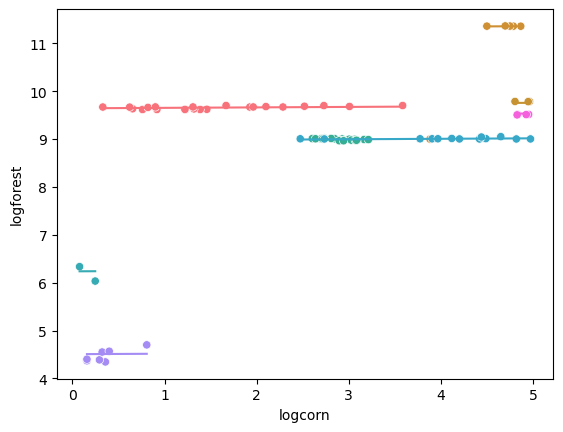

In [75]:
# subset
df_plot = last_df[(last_df["logcorn"] > 0) & (last_df["logcorn"] < 5)].copy()

# get number of countries
cou = np.unique(df_plot.loc[:,"country"].values)
colors = sns.color_palette(n_colors=len(cou)).as_hex()

# estimate ols and store fitted values
est_ols = sm.OLS.from_formula("logforest ~ logcorn", data=df_plot).fit()
df_plot["fitted_values"] = est_ols.fittedvalues

# estimate fe with dummies and store fitted values
est_fe = sm.OLS.from_formula("logforest ~ logcorn + C(country)", data=last_df).fit()
df_plot["fitted_values_fe"] = est_fe.fittedvalues

# plot observations
sns.scatterplot(x='logcorn', y='logforest', data=df_plot, hue="country", legend = False)

# plot fe fit lines (crossing fitted values)
for i in range(len(cou)):
    df_temp = df_plot.query(f"country=='{cou[i]}'")
    sns.lineplot(x='logcorn', y='fitted_values_fe', data=df_temp, hue="country", legend = False)

# **Whole disantangling**

<Axes: xlabel='corn', ylabel='forest'>

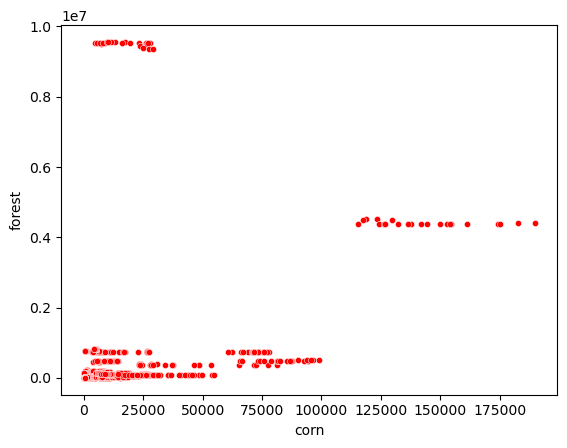

In [77]:
# plot
sns.scatterplot(x='corn', y='forest', data=last_df, color = "r", s = 20)

<Axes: xlabel='logcorn', ylabel='logforest'>

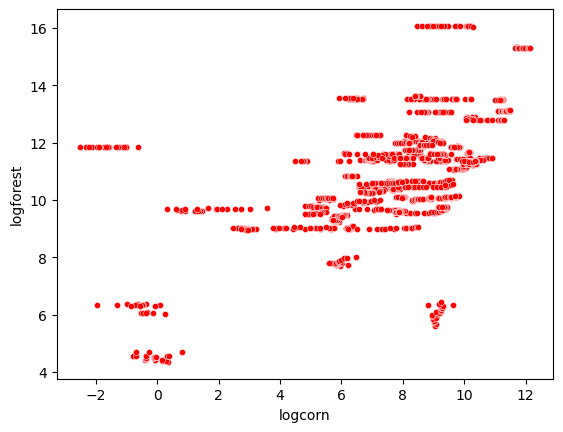

In [78]:
# plot
sns.scatterplot(x='logcorn', y='logforest', data=last_df, color = "r", s = 20)

In [79]:
# dummy reg on years
est_ols = sm.OLS.from_formula("logforest ~ C(year)", data=last_df).fit()
est_ols.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,10.8272,0.245,44.280,0.000,10.348,11.307
C(year)[T.2001],0.0004,0.346,0.001,0.999,-0.678,0.679
C(year)[T.2002],0.0017,0.346,0.005,0.996,-0.677,0.680
C(year)[T.2003],0.0039,0.346,0.011,0.991,-0.674,0.682
C(year)[T.2004],0.0060,0.346,0.017,0.986,-0.672,0.684
C(year)[T.2005],0.0072,0.346,0.021,0.983,-0.671,0.686
C(year)[T.2006],0.0087,0.346,0.025,0.980,-0.670,0.687
C(year)[T.2007],0.0103,0.346,0.030,0.976,-0.668,0.689
C(year)[T.2008],0.0123,0.346,0.036,0.972,-0.666,0.691
C(year)[T.2009],0.0136,0.346,0.039,0.969,-0.665,0.692


In [80]:
# compute mean by year
last_df.groupby("year")["logforest"].mean()

year
2000    10.827192
2001    10.827547
2002    10.828933
2003    10.831124
2004    10.833203
2005    10.834361
2006    10.835882
2007    10.837536
2008    10.839505
2009    10.840751
2010    10.840176
2011    10.840001
2012    10.840171
2013    10.841315
2014    10.839081
2015    10.839882
2016    10.845111
2017    10.846984
2018    10.851436
2019    10.857672
2020    10.858595
2021    10.861847
Name: logforest, dtype: float64

In [81]:
# compute means by country
y = "logforest"
X = ["logcorn","price", 'loggdp', 'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci']
mean_df = last_df.groupby("country")[[y] + X].mean()
mean_df.head()

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\315821210.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,logforest,logcorn,price,loggdp,Average_Temperature,rain,wdi_poprul,bci_bci
country,,,,,,,,
Albania,9.031029,6.267363,3.956591,9.210769,12.835102,1485.0,47.462727,57.588636
Algeria,9.657434,1.577275,3.956591,11.781762,24.031033,89.0,32.416364,49.696818
Angola,13.526993,9.541562,3.956591,10.980305,22.322585,1010.0,40.244545,65.056818
Argentina,12.815540,10.565265,3.956591,12.795960,14.813023,591.0,9.180909,52.731364
Australia,13.540354,6.420808,3.956591,13.834049,22.222589,534.0,14.792727,8.924545


In [82]:
# compute demeaned df
demeaned_df = (last_df.set_index("country") # set the index as the person indicator
               [[y] + X]
               - mean_df) # subtract the mean data

demeaned_df.head()

,logforest,logcorn,price,loggdp,Average_Temperature,rain,wdi_poprul,bci_bci
country,,,,,,,,
Albania,-0.035641,0.005514,-1.639091,-1.053804,-0.256987,0.0,10.797273,1.901364
Albania,-0.029991,-0.013534,-1.866591,-0.935167,-0.309666,0.0,10.097273,1.631364
Albania,-0.030152,-0.052755,-1.599091,-0.831490,-0.241919,0.0,9.037273,1.291364
Albania,-0.024496,-0.086601,-1.496591,-0.587153,-0.139909,0.0,7.967273,0.731364
Albania,-0.015950,-0.118895,-1.909091,-0.332128,-0.632803,0.0,6.887273,0.281364


In [83]:
# compute with ols fe estimator
est_fe = sm.OLS.from_formula(f"{y} ~ {'+'.join(X)}", data=demeaned_df).fit()
print(est_fe.summary())

                            OLS Regression Results                            
Dep. Variable:              logforest   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.057
Method:                 Least Squares   F-statistic:                     13.14
Date:                Tue, 17 Dec 2024   Prob (F-statistic):           1.79e-16
Time:                        13:32:37   Log-Likelihood:                 2466.4
No. Observations:                1408   AIC:                            -4917.
Df Residuals:                    1400   BIC:                            -4875.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            2.992e-17    

# **Debugging**

In [85]:
last_df[['country', 'logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('country').std().tail(5)

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\2956682056.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,logforest,logcorn,price,loggdp,rain,Average_Temperature,bci_bci,wdi_poprul
country,,,,,,,,
Ukraine,0.017089,0.529731,1.455418,0.535055,0.000000,0.627869,1.081752,0.822871
Uruguay,0.059782,0.392983,1.455418,0.591537,7.462025,0.350511,3.334493,1.116132
Uzbekistan,0.080363,0.197252,1.455418,0.726716,0.000000,0.542795,2.087323,1.574561
Viet Nam,0.009533,0.161922,1.455418,0.851189,0.000000,0.402369,1.825454,4.250820
Zambia,0.005613,0.388284,1.455418,0.694815,0.000000,0.317456,2.132072,3.263437


Extremely low within-entity variation


In [87]:
df_std= (last_df[['country', 'forest', 'corn', 'price', 'gdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('country').std()/last_df[['forest', 'corn', 'price', 'gdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].std())
df_stdt= (last_df[['year', 'forest', 'corn', 'price', 'gdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('year').std()/last_df[['forest', 'corn', 'price', 'gdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].std())

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3960412572.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [88]:
logdf_std= (last_df[['country', 'logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('country').std()/last_df[['logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].std())
logdf_stdt= (last_df[['year', 'logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('year').std()/last_df[['logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].std())

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3562108858.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [89]:
logdf_std

,logforest,logcorn,price,loggdp,rain,Average_Temperature,bci_bci,wdi_poprul
country,,,,,,,,
Albania,0.011652,0.030177,1.023169,0.243857,0.000000,0.068690,0.053388,0.349338
Algeria,0.015578,0.320046,1.023169,0.235647,0.000000,0.064724,0.071852,0.231416
Angola,0.001295,0.185681,1.023169,0.426602,0.000000,0.054212,0.111950,0.269535
Argentina,0.020884,0.163103,1.023169,0.269800,0.000000,0.050763,0.071046,0.049188
Australia,0.002372,0.075873,1.023169,0.247554,0.000000,0.065636,0.057183,0.036733
...,...,...,...,...,...,...,...,...
Ukraine,0.008802,0.198934,1.023169,0.280046,0.000000,0.084108,0.071739,0.042558
Uruguay,0.030791,0.147579,1.023169,0.309609,0.010227,0.046954,0.221135,0.057725
Uzbekistan,0.041392,0.074075,1.023169,0.380361,0.000000,0.072712,0.138426,0.081435


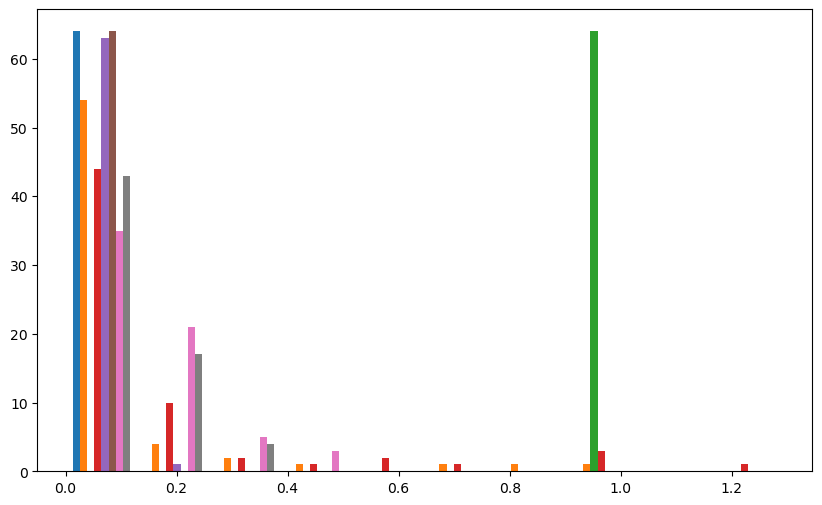

In [90]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.hist(df_std)
plt.show()

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3119686693.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Axes: ylabel='None'>

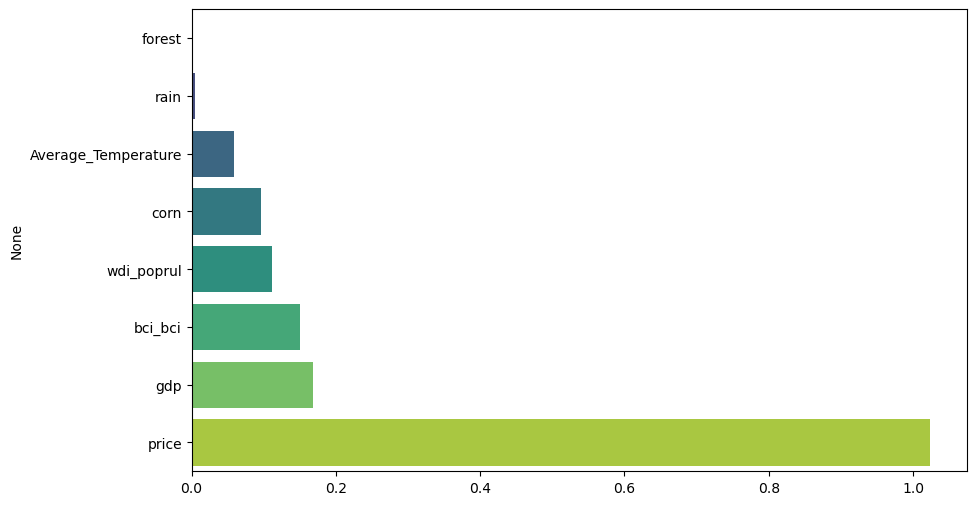

In [91]:
mean_within_variation = df_std.mean().sort_values()

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(
    x=mean_within_variation.values,
    y=mean_within_variation.index,
    palette="viridis"
)

In [92]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + loggdp + rain + Average_Temperature + bci_bci + wdi_poprul + EntityEffects + TimeEffects",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
resid = result.resids

print(result.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.0350
Estimator:                   PanelOLS   R-squared (Between):              0.0162
No. Observations:                1408   R-squared (Within):               0.0285
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.0162
Time:                        13:32:39   Log-likelihood                    2480.7
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      7.9546
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(6,1317)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             2.3810
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

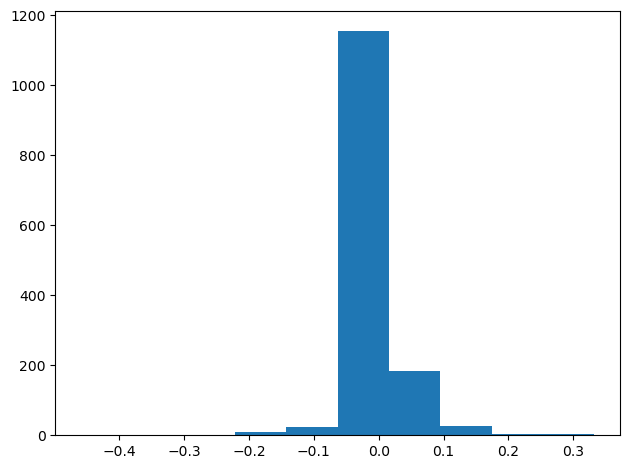

-1.0670115230059458


In [93]:
plt.figure()
plt.hist(resid)
plt.tight_layout()
plt.show()

print(resid.skew())

In [94]:
logdf_std

,logforest,logcorn,price,loggdp,rain,Average_Temperature,bci_bci,wdi_poprul
country,,,,,,,,
Albania,0.011652,0.030177,1.023169,0.243857,0.000000,0.068690,0.053388,0.349338
Algeria,0.015578,0.320046,1.023169,0.235647,0.000000,0.064724,0.071852,0.231416
Angola,0.001295,0.185681,1.023169,0.426602,0.000000,0.054212,0.111950,0.269535
Argentina,0.020884,0.163103,1.023169,0.269800,0.000000,0.050763,0.071046,0.049188
Australia,0.002372,0.075873,1.023169,0.247554,0.000000,0.065636,0.057183,0.036733
...,...,...,...,...,...,...,...,...
Ukraine,0.008802,0.198934,1.023169,0.280046,0.000000,0.084108,0.071739,0.042558
Uruguay,0.030791,0.147579,1.023169,0.309609,0.010227,0.046954,0.221135,0.057725
Uzbekistan,0.041392,0.074075,1.023169,0.380361,0.000000,0.072712,0.138426,0.081435


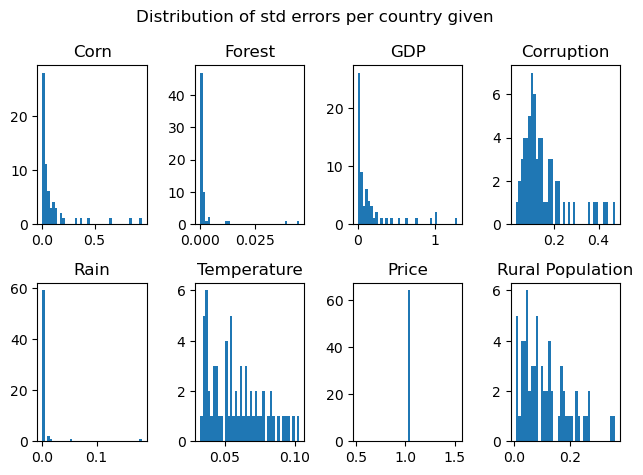

In [95]:
fig, axs = plt.subplots(2,4)

fig.suptitle('Distribution of std errors per country given')

# Log Corn
axs[0, 0].set_title('Corn')
axs[0, 0].hist(df_std['corn'], bins=40)
#axs[0, 0].set_xlabel('log corn')


# Log Forest
axs[0, 1].set_title('Forest')
axs[0, 1].hist(df_std['forest'], bins=40)
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('GDP')
axs[0, 2].hist(df_std['gdp'], bins=40)
#axs[0, 2].set_xlabel('log gdp')

# BCI
axs[0, 3].set_title('Corruption')
axs[0, 3].hist(logdf_std['bci_bci'], bins=40)
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 0].set_title('Rain')
axs[1, 0].hist(logdf_std['rain'], bins=40)
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[1, 1].set_title('Temperature')
axs[1, 1].hist(logdf_std['Average_Temperature'], bins=40)
#axs[2, 0].set_xlabel('temperature')

# Price
axs[1, 2].set_title('Price')
axs[1, 2].hist(logdf_std['price'], bins=40)
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[1, 3].set_title('Rural Population')
axs[1, 3].hist(logdf_std['wdi_poprul'], bins=40)
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

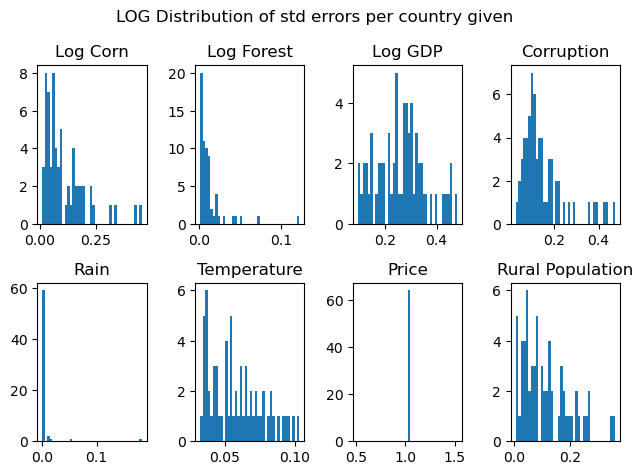

In [96]:
fig, axs = plt.subplots(2,4)

fig.suptitle('LOG Distribution of std errors per country given')

# Log Corn
axs[0, 0].set_title('Log Corn')
axs[0, 0].hist(logdf_std['logcorn'], bins=40)
#axs[0, 0].set_xlabel('log corn')


# Log Forest
axs[0, 1].set_title('Log Forest')
axs[0, 1].hist(logdf_std['logforest'], bins=40)
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
axs[0, 2].hist(logdf_std['loggdp'], bins=40)
#axs[0, 2].set_xlabel('log gdp')

# BCI
axs[0, 3].set_title('Corruption')
axs[0, 3].hist(logdf_std['bci_bci'], bins=40)
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 0].set_title('Rain')
axs[1, 0].hist(logdf_std['rain'], bins=40)
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[1, 1].set_title('Temperature')
axs[1, 1].hist(logdf_std['Average_Temperature'], bins=40)
#axs[2, 0].set_xlabel('temperature')

# Price
axs[1, 2].set_title('Price')
axs[1, 2].hist(logdf_std['price'], bins=40)
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[1, 3].set_title('Rural Population')
axs[1, 3].hist(logdf_std['wdi_poprul'], bins=40)
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

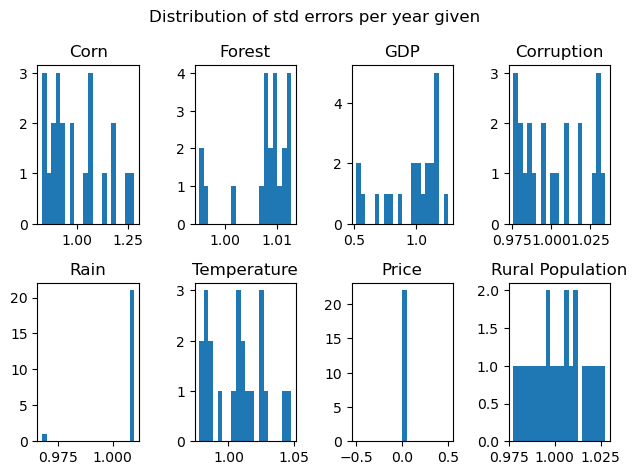

In [97]:
fig, axs = plt.subplots(2,4)

fig.suptitle('Distribution of std errors per year given')

# Log Corn
axs[0, 0].set_title('Corn')
axs[0, 0].hist(df_stdt['corn'], bins=20)
#axs[0, 0].set_xlabel('log corn')


# Log Forest
axs[0, 1].set_title('Forest')
axs[0, 1].hist(df_stdt['forest'], bins=20)
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('GDP')
axs[0, 2].hist(df_stdt['gdp'], bins=20)
#axs[0, 2].set_xlabel('log gdp')

# BCI
axs[0, 3].set_title('Corruption')
axs[0, 3].hist(df_stdt['bci_bci'], bins=20)
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 0].set_title('Rain')
axs[1, 0].hist(df_stdt['rain'], bins=20)
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[1, 1].set_title('Temperature')
axs[1, 1].hist(df_stdt['Average_Temperature'], bins=20)
#axs[2, 0].set_xlabel('temperature')

# Price
axs[1, 2].set_title('Price')
axs[1, 2].hist(df_stdt['price'], bins=20)
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[1, 3].set_title('Rural Population')
axs[1, 3].hist(df_stdt['wdi_poprul'], bins=20)
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

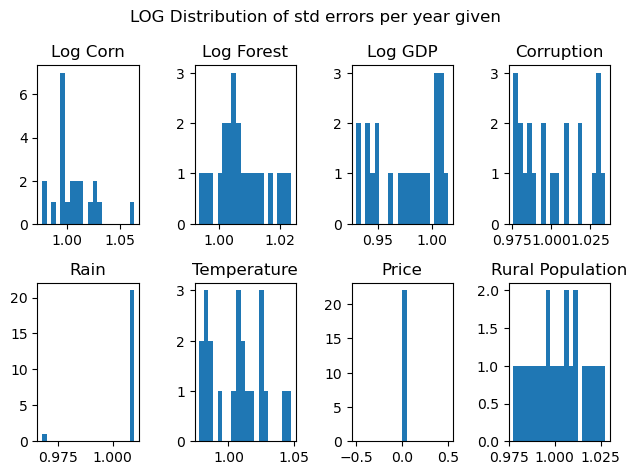

In [98]:
fig, axs = plt.subplots(2,4)

fig.suptitle('LOG Distribution of std errors per year given')

# Log Corn
axs[0, 0].set_title('Log Corn')
axs[0, 0].hist(logdf_stdt['logcorn'], bins=20)
#axs[0, 0].set_xlabel('log corn')


# Log Forest
axs[0, 1].set_title('Log Forest')
axs[0, 1].hist(logdf_stdt['logforest'], bins=20)
#axs[0, 1].set_xlabel('log land')

# Log GDP
axs[0, 2].set_title('Log GDP')
axs[0, 2].hist(logdf_stdt['loggdp'], bins=20)
#axs[0, 2].set_xlabel('log gdp')

# BCI
axs[0, 3].set_title('Corruption')
axs[0, 3].hist(logdf_stdt['bci_bci'], bins=20)
#axs[1, 1].set_xlabel('corruption')


# Rain
axs[1, 0].set_title('Rain')
axs[1, 0].hist(logdf_stdt['rain'], bins=20)
#axs[1, 2].set_xlabel('rain')

# Temperature
axs[1, 1].set_title('Temperature')
axs[1, 1].hist(logdf_stdt['Average_Temperature'], bins=20)
#axs[2, 0].set_xlabel('temperature')

# Price
axs[1, 2].set_title('Price')
axs[1, 2].hist(logdf_stdt['price'], bins=20)
#axs[2, 1].set_xlabel('price')

# Rural Population
axs[1, 3].set_title('Rural Population')
axs[1, 3].hist(logdf_stdt['wdi_poprul'], bins=20)
#axs[2, 2].set_xlabel('rural pop')

plt.tight_layout()
plt.show()

In [99]:
df_stdt

,forest,corn,price,gdp,rain,Average_Temperature,bci_bci,wdi_poprul
year,,,,,,,,
2000,1.012589,0.845829,0.0,0.517313,0.967936,0.982156,0.977817,1.027576
2001,1.012578,0.868571,0.0,0.520264,1.009706,1.011866,0.985859,1.024537
2002,1.012465,0.829968,0.0,0.555681,1.009289,1.007149,0.994682,1.021519
2003,1.012717,0.904203,0.0,0.670927,1.009706,1.026426,1.001471,1.018229
2004,1.009692,0.886403,0.0,0.765642,1.009706,1.025591,1.009270,1.015112
2005,1.009714,0.829986,0.0,0.799301,1.009706,1.041806,1.019235,1.012422
2006,1.009898,0.884905,0.0,0.855393,1.009706,1.024538,1.028348,1.010253
2007,1.010624,0.939292,0.0,0.990595,1.009289,0.985113,1.031608,1.008405
2008,1.010982,0.976095,0.0,1.094591,1.009289,0.979374,1.030894,1.006735


In [100]:
last_df[['country','year','wdi_poprul']]

,country,year,wdi_poprul
23,Angola,2000,49.91
24,Angola,2001,48.73
25,Angola,2002,47.54
26,Angola,2003,46.35
27,Angola,2004,45.17
...,...,...,...
4290,Zambia,2017,57.02
4291,Zambia,2018,56.48
4292,Zambia,2019,55.93
4293,Zambia,2020,55.37


In [101]:
df_std[df_std['wdi_poprul'] == df_std['wdi_poprul'].max()]

,forest,corn,price,gdp,rain,Average_Temperature,bci_bci,wdi_poprul
country,,,,,,,,
Dominican Republic,0.000424,0.001462,1.023169,0.035282,0.0,0.035738,0.108439,0.360187


In [102]:
last_df[last_df['country'] == 'Egypt'][['year', 'wdi_poprul', 'bci_bci']]

,year,wdi_poprul,bci_bci
1172,2000,57.20,52.63
1173,2001,57.16,52.46
1174,2002,57.11,52.19
1175,2003,57.06,52.12
1176,2004,57.02,51.91
1177,2005,56.97,51.65
1178,2006,56.93,51.43
1179,2007,56.92,51.17
1180,2008,56.94,50.93
1181,2009,56.96,50.72


In [103]:
last_df.groupby('year')['wdi_poprul'].std()

year
2000    19.868358
2001    19.809588
2002    19.751242
2003    19.687625
2004    19.627366
2005    19.575347
2006    19.533409
2007    19.497676
2008    19.465384
2009    19.433513
2010    19.399930
2011    19.362286
2012    19.321618
2013    19.279732
2014    19.238267
2015    19.196162
2016    19.152824
2017    19.107735
2018    19.059248
2019    19.008023
2020    18.953368
2021    18.897129
Name: wdi_poprul, dtype: float64

In [104]:
# Create the lagged variable for logcorn within each country
last_df['logforest_lag1'] = last_df.groupby('country')['logforest'].shift(1)

# Check the first few rows to confirm
print(last_df[['country', 'logforest', 'logcorn', 'logforest_lag1']].head(25))

    country  logforest    logcorn  logforest_lag1
23   Angola  13.520753   8.834705             NaN
24   Angola  13.522450   8.916196       13.520753
25   Angola  13.522851   9.006298       13.522450
26   Angola  13.524082   9.009991       13.522851
27   Angola  13.526151   9.275915       13.524082
28   Angola  13.527914   9.296747       13.526151
29   Angola  13.527972   9.325860       13.527914
30   Angola  13.527309   9.400843       13.527972
31   Angola  13.527697   9.086978       13.527309
32   Angola  13.529487   9.593486       13.527697
33   Angola  13.528456   9.608992       13.529487
34   Angola  13.528555   9.747501       13.528456
35   Angola  13.528160   8.673739       13.528555
36   Angola  13.527809   9.702582       13.528160
37   Angola  13.527569   9.695347       13.527809
38   Angola  13.527569   9.724314       13.527569
39   Angola  13.529953  10.037832       13.527569
40   Angola  13.530613  10.190305       13.529953
41   Angola  13.529460  10.180943       13.530613


C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3430524543.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [105]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest_lag1 ~ 1 + logcorn + price + loggdp + Average_Temperature + rain + bci_bci + EntityEffects",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:         logforest_lag1   R-squared:                        0.0579
Estimator:                   PanelOLS   R-squared (Between):             -0.1241
No. Observations:                1344   R-squared (Within):               0.0579
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.1240
Time:                        13:32:47   Log-likelihood                    2416.8
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      13.046
Entities:                          64   P-value                           0.0000
Avg Obs:                       21.000   Distribution:                  F(6,1274)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):          8.702e+15
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\model.py:1260: MissingValueWarning:


Inputs contain missing values. Dropping rows with missing observations.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass ob

In [106]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest_lag1 ~ 1 + logcorn + loggdp + price + rain + Average_Temperature + bci_bci + EntityEffects",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\model.py:1260: MissingValueWarning:


Inputs contain missing values. Dropping rows with missing observations.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



                          PanelOLS Estimation Summary                           
Dep. Variable:         logforest_lag1   R-squared:                        0.0579
Estimator:                   PanelOLS   R-squared (Between):             -0.1241
No. Observations:                1344   R-squared (Within):               0.0579
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.1240
Time:                        13:32:47   Log-likelihood                    2416.8
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      13.046
Entities:                          64   P-value                           0.0000
Avg Obs:                       21.000   Distribution:                  F(6,1274)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):          1.812e+16
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

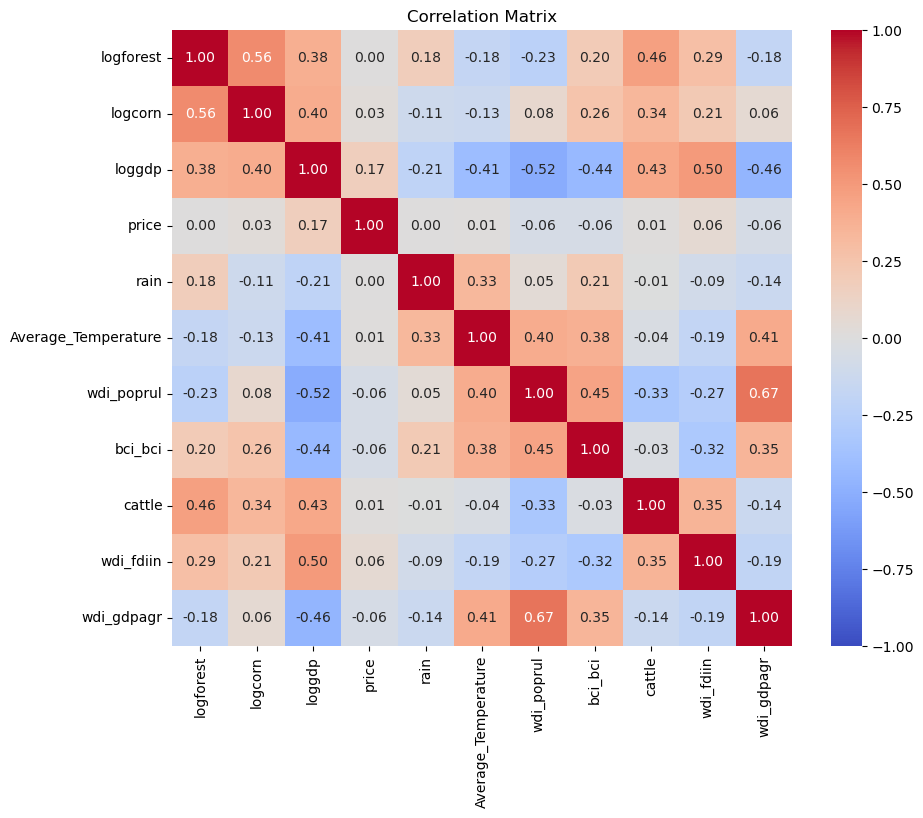

In [107]:
# Assuming 'fe_resid' is a Pandas Series, make sure it has the same length as the other variables.
# Combine all your variables into a single DataFrame
variables = pd.DataFrame({
    'logforest': last_df['logforest'],
    'logcorn': last_df['logcorn'],
    'loggdp': last_df['loggdp'],
    'price': last_df['price'],
    'rain': last_df['rain'],
    'Average_Temperature': last_df['Average_Temperature'],
    'wdi_poprul': last_df['wdi_poprul'],
    'bci_bci': last_df['bci_bci'],
    'cattle':last_df['cattle'],
    'wdi_fdiin':last_df['wdi_fdiin'],
    'wdi_gdpagr':last_df['wdi_gdpagr']
})

# Compute the correlation matrix
correlation_matrix = variables.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

In [108]:
df_std

,forest,corn,price,gdp,rain,Average_Temperature,bci_bci,wdi_poprul
country,,,,,,,,
Albania,0.000148,0.001840,1.023169,0.005974,0.000000,0.068690,0.053388,0.349338
Algeria,0.000366,0.000349,1.023169,0.077597,0.000000,0.064724,0.071852,0.231416
Angola,0.001462,0.321691,1.023169,0.064172,0.000000,0.054212,0.111950,0.269535
Argentina,0.011861,0.846063,1.023169,0.254255,0.000000,0.050763,0.071046,0.049188
Australia,0.002726,0.005223,1.023169,0.638723,0.000000,0.065636,0.057183,0.036733
...,...,...,...,...,...,...,...,...
Ukraine,0.001219,0.651595,1.023169,0.075887,0.000000,0.084108,0.071739,0.042558
Uruguay,0.000928,0.013566,1.023169,0.029679,0.010227,0.046954,0.221135,0.057725
Uzbekistan,0.000160,0.003601,1.023169,0.039368,0.000000,0.072712,0.138426,0.081435


In [109]:
test = last_df[['country', 'logforest', 'logcorn', 'price', 'loggdp', 'rain', 'Average_Temperature', 'bci_bci', 'wdi_poprul']].groupby('country').std()

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\1944839693.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [110]:
test.describe()

,logforest,logcorn,price,loggdp,rain,Average_Temperature,bci_bci,wdi_poprul
count,64.000000,64.000000,6.400000e+01,64.000000,64.000000,64.000000,64.000000,64.000000
mean,0.024873,0.288606,1.455418e+00,0.502812,3.207671,0.435494,2.260958,2.150104
std,0.037012,0.251313,8.951997e-16,0.181866,17.448892,0.139384,1.527079,1.636460
min,0.002220,0.029233,1.455418e+00,0.181389,0.000000,0.242729,0.379477,0.127901
25%,0.006032,0.104066,1.455418e+00,0.365472,0.000000,0.310967,1.380828,0.878867
50%,0.014789,0.199645,1.455418e+00,0.515853,0.000000,0.410081,1.734760,1.639920
75%,0.024160,0.399131,1.455418e+00,0.606147,0.000000,0.533314,2.756699,3.234297
max,0.238500,1.214189,1.455418e+00,0.917097,133.890050,0.770607,7.158074,6.964280


In [111]:
highstd = test.sort_values(by='logforest', ascending=False).reset_index()

In [112]:
#percentile of logforest
highstd = highstd[highstd['logforest'] > highstd['logforest'].quantile(0.5)]

In [113]:
subset = last_df[last_df['country'].isin(highstd['country'])]
subset['country'].unique()

['Albania', 'Argentina', 'Austria', 'Azerbaijan', 'Benin', ..., 'Togo', 'Ukraine', 'Uruguay', 'Uzbekistan', 'South Africa']
Length: 32
Categories (64, object): ['Albania', 'Algeria', 'Angola', 'Argentina', ..., 'Uruguay', 'Uzbekistan', 'Viet Nam', 'Zambia']

In [114]:
highstd = test.sort_values(by='logforest', ascending=False).reset_index()
hhstd = highstd[(highstd['logforest'] > highstd['logforest'].quantile(0.75)) & (highstd['logcorn'] > highstd['logcorn'].quantile(0.5))]
subset = last_df[last_df['country'].isin(hhstd['country'])]
subset['country'].unique()

['Argentina', 'Benin', 'Burkina Faso', 'Bangladesh', 'Algeria', ..., 'Mauritius', 'Paraguay', 'Qatar', 'Togo', 'Uruguay']
Length: 12
Categories (64, object): ['Albania', 'Algeria', 'Angola', 'Argentina', ..., 'Uruguay', 'Uzbekistan', 'Viet Nam', 'Zambia']

In [115]:
hhstd.describe()

,logforest,logcorn,price,loggdp,rain,Average_Temperature,bci_bci,wdi_poprul
count,12.000000,12.000000,1.200000e+01,12.000000,12.000000,12.000000,12.000000,12.000000
mean,0.057367,0.496762,1.455418e+00,0.597507,0.621835,0.369360,2.117236,2.608265
std,0.034646,0.285854,2.319180e-16,0.154064,2.154101,0.100756,0.915126,1.751579
min,0.024618,0.230894,1.455418e+00,0.364698,0.000000,0.261770,0.943374,0.501923
25%,0.036917,0.356779,1.455418e+00,0.504411,0.000000,0.288069,1.313443,0.971546
50%,0.042896,0.417623,1.455418e+00,0.570411,0.000000,0.364729,2.192096,2.658194
75%,0.067429,0.506644,1.455418e+00,0.653231,0.000000,0.403428,2.897909,4.157298
max,0.139419,1.214189,1.455418e+00,0.879241,7.462025,0.599522,3.334493,5.094194


In [116]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest_lag1 ~ 1 + logcorn + price + loggdp + Average_Temperature + bci_bci + EntityEffects",
                            data=subset.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:         logforest_lag1   R-squared:                        0.0764
Estimator:                   PanelOLS   R-squared (Between):             -0.1426
No. Observations:                 252   R-squared (Within):               0.0764
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.1424
Time:                        13:32:48   Log-likelihood                    354.61
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      3.8891
Entities:                          12   P-value                           0.0021
Avg Obs:                       21.000   Distribution:                   F(5,235)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):             2.0910
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\model.py:1260: MissingValueWarning:


Inputs contain missing values. Dropping rows with missing observations.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass ob

In [117]:
lagged_subset = subset[['country', 'year', 'logforest', 'logcorn', 'loggdp', 'price', 'rain', 'Average_Temperature', 'wdi_poprul', 'bci_bci']]
lagged_subset

,country,year,logforest,logcorn,loggdp,price,rain,Average_Temperature,wdi_poprul,bci_bci
92,Argentina,2000,12.910439,10.338096,12.638336,2.3175,591.0,13.845887,10.86,54.57
93,Argentina,2001,12.893580,10.245482,12.582228,2.0900,591.0,14.548151,10.67,54.40
94,Argentina,2002,12.884564,10.094159,11.613527,2.3575,591.0,14.346806,10.49,54.27
95,Argentina,2003,12.868055,10.053138,11.852565,2.4600,591.0,14.864838,10.31,54.05
96,Argentina,2004,12.849180,10.059894,12.019428,2.0475,591.0,14.817495,10.14,53.87
...,...,...,...,...,...,...,...,...,...,...
4038,Uruguay,2017,9.976836,6.492240,11.082236,3.5075,1300.0,18.429832,4.76,24.79
4039,Uruguay,2018,9.973806,6.568078,11.085262,3.7500,1300.0,17.976957,4.67,24.09
4040,Uruguay,2019,9.977709,6.975414,11.035673,3.8775,1300.0,17.705373,4.57,22.61
4041,Uruguay,2020,9.983176,7.062192,10.890552,4.8400,1300.0,17.608070,4.48,21.27


In [118]:
# Create the lagged variable for logcorn within each country
lagged_subset['logcorn_lag1'] = subset.groupby('country', observed=True)['logcorn'].shift(-1)

# Drop 2021 rows
lagged_subset.dropna(inplace=True)
lagged_subset.head(22)

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3447230923.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3447230923.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,country,year,logforest,logcorn,loggdp,price,rain,Average_Temperature,wdi_poprul,bci_bci,logcorn_lag1
92,Argentina,2000,12.910439,10.338096,12.638336,2.3175,591.0,13.845887,10.86,54.57,10.245482
93,Argentina,2001,12.893580,10.245482,12.582228,2.0900,591.0,14.548151,10.67,54.40,10.094159
94,Argentina,2002,12.884564,10.094159,11.613527,2.3575,591.0,14.346806,10.49,54.27,10.053138
95,Argentina,2003,12.868055,10.053138,11.852565,2.4600,591.0,14.864838,10.31,54.05,10.059894
96,Argentina,2004,12.849180,10.059894,12.019428,2.0475,591.0,14.817495,10.14,53.87,10.234027
97,Argentina,2005,12.837653,10.234027,12.209179,2.1575,591.0,14.473485,9.97,53.62,10.105271
98,Argentina,2006,12.829200,10.105271,12.364747,3.9025,591.0,15.045753,9.80,53.34,10.253465
99,Argentina,2007,12.817968,10.253465,12.576792,4.5550,591.0,14.090086,9.63,53.24,10.437684
100,Argentina,2008,12.803127,10.437684,12.809416,4.0700,591.0,14.989706,9.47,53.11,10.066106
101,Argentina,2009,12.798218,10.066106,12.725935,4.1450,591.0,15.081761,9.31,52.74,10.276442


In [119]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn_lag1 + loggdp + Average_Temperature + bci_bci + EntityEffects",
                            data=lagged_subset.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
resid = result.resids
covmatrix = result.cov

print(result.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.0698
Estimator:                   PanelOLS   R-squared (Between):             -0.0793
No. Observations:                 252   R-squared (Within):               0.0698
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.0792
Time:                        13:32:49   Log-likelihood                    353.71
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      4.4267
Entities:                          12   P-value                           0.0018
Avg Obs:                       21.000   Distribution:                   F(4,236)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):             2.0458
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

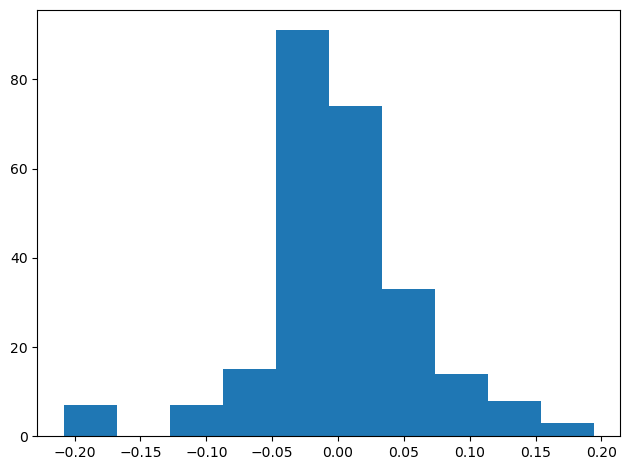

-0.3209752062136482


In [120]:
plt.figure()

plt.hist(resid)

plt.tight_layout()
plt.show()

print(resid.skew())

In [121]:
covmatrix

,Intercept,logcorn_lag1,loggdp,Average_Temperature,bci_bci
Intercept,0.573338,-0.000335,-0.022184,-0.005216,-0.004435
logcorn_lag1,-0.000335,0.000160,-0.000072,-0.000010,0.000006
loggdp,-0.022184,-0.000072,0.000988,0.000158,0.000176
Average_Temperature,-0.005216,-0.000010,0.000158,0.000168,-0.000005
bci_bci,-0.004435,0.000006,0.000176,-0.000005,0.000054


In [122]:
# Canned method
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + loggdp + EntityEffects",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
resid = result.resids
covmatrix = result.cov

print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.0576
Estimator:                   PanelOLS   R-squared (Between):              0.0127
No. Observations:                1408   R-squared (Within):               0.0576
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.0128
Time:                        13:32:49   Log-likelihood                    2463.4
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      41.037
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(2,1342)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             2.4399
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

In [123]:
covmatrix

,Intercept,logcorn,loggdp
Intercept,0.010880,-0.000138,-0.000879
logcorn,-0.000138,0.000032,-0.000009
loggdp,-0.000879,-0.000009,0.000085


In [124]:
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + corn + loggdp + price + rain + Average_Temperature + wdi_poprul + bci_bci",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.4533
Estimator:                   PanelOLS   R-squared (Between):              0.4618
No. Observations:                1408   R-squared (Within):              -16.439
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.4533
Time:                        13:32:49   Log-likelihood                   -2506.4
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      165.86
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(7,1400)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             35.076
                            

In [125]:
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + loggdp + price + rain + Average_Temperature + wdi_poprul + bci_bci",
                            data=last_df.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)
print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.5121
Estimator:                   PanelOLS   R-squared (Between):              0.5203
No. Observations:                1408   R-squared (Within):              -15.976
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.5121
Time:                        13:32:49   Log-likelihood                   -2426.3
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      209.92
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(7,1400)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             11.025
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

In [126]:
test = last_df[['country', 'year', 'forest', 'logforest', 'corn', 'logcorn', 'price', 'gdp', 'loggdp', 'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci', 'suitability', 'logsuit', 'landArea', 'logland', 'hetero', 'cattle']]

In [127]:
test['sqrtforest'] = np.sqrt(test['forest'])
test['sqrtcorn'] = np.sqrt(test['corn'])

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3012075371.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\3012075371.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [128]:
est_fe_canned = PanelOLS.from_formula("sqrtforest ~ 1 + sqrtcorn + loggdp + logland + price + rain + Average_Temperature + wdi_poprul + bci_bci + EntityEffects",
                            data=test.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

fe_resid = result.resids
fe_fit = result.fitted_values
fe_cov = result.cov

print(result.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

                          PanelOLS Estimation Summary                           
Dep. Variable:             sqrtforest   R-squared:                        0.0557
Estimator:                   PanelOLS   R-squared (Between):              0.1570
No. Observations:                1408   R-squared (Within):               0.0557
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.1570
Time:                        13:32:49   Log-likelihood                   -3872.1
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      9.8458
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(8,1336)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             2.0409
                            

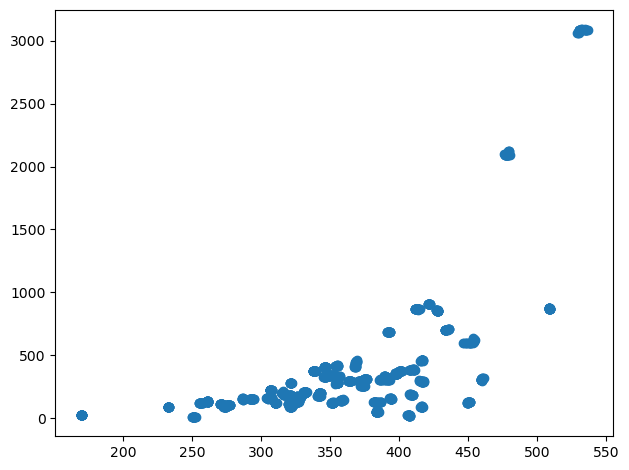

In [129]:
plt.figure()

plt.scatter(x=fe_fit, y=test['sqrtforest'])

plt.tight_layout()
plt.show()

In [130]:
test.keys()

Index(['country', 'year', 'forest', 'logforest', 'corn', 'logcorn', 'price',
       'gdp', 'loggdp', 'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci',
       'suitability', 'logsuit', 'landArea', 'logland', 'hetero', 'cattle',
       'sqrtforest', 'sqrtcorn'],
      dtype='object')

In [131]:
est_fe_canned = PanelOLS.from_formula("logforest ~ 1 + logcorn + loggdp + logland + logsuit + price + rain + Average_Temperature + wdi_poprul + bci_bci",
                            data=test.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

fe_resid = result.resids
fe_fit = result.fitted_values
fe_cov = result.cov

print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:              logforest   R-squared:                        0.7839
Estimator:                   PanelOLS   R-squared (Between):              0.7875
No. Observations:                1408   R-squared (Within):              -6.5040
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.7839
Time:                        13:32:50   Log-likelihood                   -1853.0
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      563.43
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(9,1398)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             37.386
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

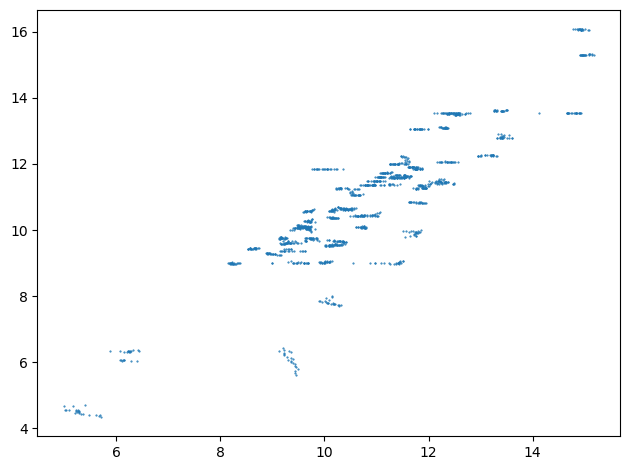

In [132]:
plt.figure()

plt.scatter(x=fe_fit, y=test['logforest'], s=0.25)

plt.tight_layout()
plt.show()

# **BREAK TEST**

## **Setting test dataset**

In [135]:
from scipy.stats import anderson
from scipy.stats import shapiro
from scipy.stats import kstest, norm
import scipy.stats as stats

In [136]:
last_df[last_df['iso3'] == 'RUS']['country'].unique()

['Russian Federation']
Categories (64, object): ['Albania', 'Algeria', 'Angola', 'Argentina', ..., 'Uruguay', 'Uzbekistan', 'Viet Nam', 'Zambia']

In [137]:
test = last_df[['country', 'year', 'forest', 'logforest', 'corn', 'logcorn', 'price', 'gdp', 'loggdp', 
                'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci', 'suitability', 'logsuit', 
                'landArea', 'logland', 'hetero', 'cattle', 'wdi_fdiin', 'wdi_gdpagr']]
test['sqrtforest'] = np.sqrt(test['forest'])
test['sqrtcorn'] = np.sqrt(test['corn'])
test['sqrtgdp'] = np.sqrt(test['gdp'])
test['sqrtsuit'] = np.sqrt(test['suitability'])
test['sqrtsuit'] = test.groupby('country')['sqrtsuit'].transform(lambda x: x.fillna(0))
test['sqrtland'] = np.sqrt(test['landArea'])
test['cattleM'] = test['cattle']/1000 #milliers de têtes
test['sqrtgdpagr'] = np.sqrt(test['wdi_gdpagr'])

test['forestM'] = test['forest']
#test = test[~test["country"].isin(['Brazil', 'Russian Federation'])]

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\2547417197.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\2547417197.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\2547417197.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [138]:
len(test['country'].unique())

64

In [139]:
test.keys()

Index(['country', 'year', 'forest', 'logforest', 'corn', 'logcorn', 'price',
       'gdp', 'loggdp', 'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci',
       'suitability', 'logsuit', 'landArea', 'logland', 'hetero', 'cattle',
       'wdi_fdiin', 'wdi_gdpagr', 'sqrtforest', 'sqrtcorn', 'sqrtgdp',
       'sqrtsuit', 'sqrtland', 'cattleM', 'sqrtgdpagr', 'forestM'],
      dtype='object')

In [140]:
viftest = test[[
    'forestM', 'sqrtcorn', 'sqrtgdp', 'price', 'rain', 'Average_Temperature', 'wdi_poprul', 'sqrtgdpagr', 'wdi_fdiin', 'cattleM']]

In [141]:
vif_data = pd.DataFrame()
vif_data["Variable"] = viftest.columns
vif_data["VIF"] = [variance_inflation_factor(viftest.values, i) for i in range(viftest.shape[1])]
print(vif_data)

              Variable       VIF
0              forestM  1.589465
1             sqrtcorn  2.039425
2              sqrtgdp  2.244753
3                price  0.756372
4                 rain  1.233801
5  Average_Temperature  1.549982
6           wdi_poprul  2.241083
7           sqrtgdpagr  2.796316
8            wdi_fdiin  1.902738
9              cattleM  2.551289


## **$SLR$**

In [143]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn",
                            data=test.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

slr_resid = result.resids
slr_fit = result.fitted_values
slr_cov = result.cov

print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.1210
Estimator:                   PanelOLS   R-squared (Between):              0.1251
No. Observations:                1408   R-squared (Within):              -70.162
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.1210
Time:                        13:32:51   Log-likelihood                -2.171e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      193.52
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(1,1406)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             5.7776
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

6.243544222888793


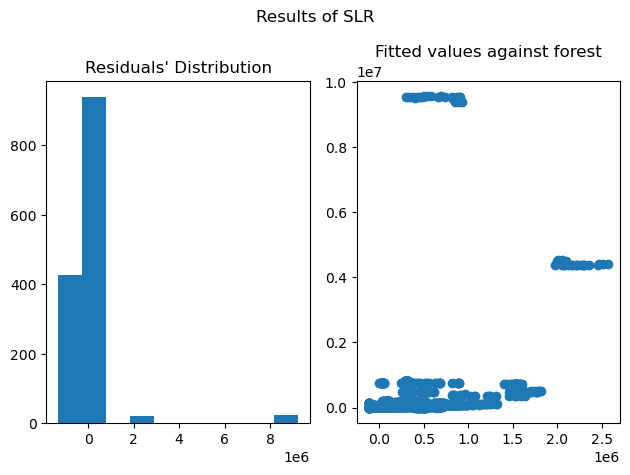

In [144]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of SLR')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(slr_resid)
print(slr_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=slr_fit, y=test['forestM'])

plt.tight_layout()
plt.show()



In [145]:
slr_cov.round(4)

,Intercept,sqrtcorn
Intercept,1.823038e+10,-2.229903e+08
sqrtcorn,-2.229903e+08,6.608497e+06


## **$MLR$**

In [147]:
np.cov(test['sqrtgdp'], test['sqrtgdpagr'])

array([[ 1.70813995e+05, -1.60529579e+03],
       [-1.60529579e+03,  7.79560807e+01]])

In [148]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn + sqrtgdp + price + rain + Average_Temperature + sqrtgdpagr + wdi_poprul + cattleM",
                            data=test.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

mlr_resid = result.resids
mlr_fit = result.fitted_values
mlr_cov = result.cov

print(result.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.3785
Estimator:                   PanelOLS   R-squared (Between):              0.3836
No. Observations:                1408   R-squared (Within):              -86.190
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.3785
Time:                        13:32:51   Log-likelihood                -2.147e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      106.52
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(8,1399)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             17.938
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

5.249206945368479


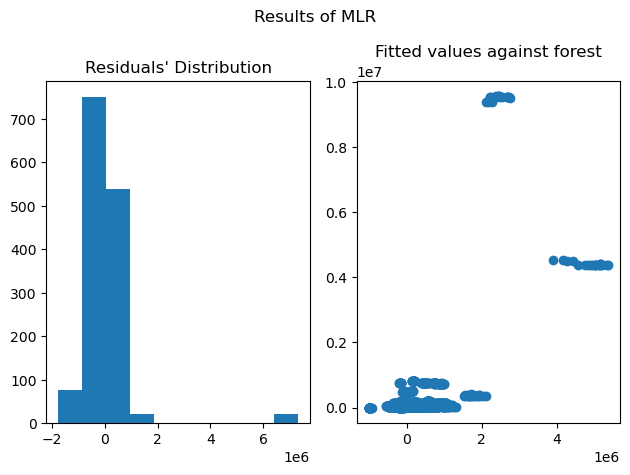

In [149]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of MLR')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(mlr_resid)
print(mlr_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=mlr_fit, y=test['forestM'])

plt.tight_layout()
plt.show()


In [150]:
mlr_cov

,Intercept,sqrtcorn,sqrtgdp,price,rain,Average_Temperature,sqrtgdpagr,wdi_poprul,cattleM
Intercept,4.267291e+11,-2.310554e+08,9.434979e+07,2.885395e+09,3.137319e+07,-3.164443e+10,9.446763e+09,7.483373e+08,1.769240e+07
sqrtcorn,-2.310554e+08,1.842414e+06,-3.268141e+05,-7.431319e+05,-4.447661e+04,2.879923e+07,-9.007744e+06,-4.136386e+06,-2.326371e+04
sqrtgdp,9.434979e+07,-3.268141e+05,1.277613e+05,-1.157542e+06,2.150966e+04,-1.155041e+07,3.681786e+06,1.134776e+06,5.978207e+03
price,2.885395e+09,-7.431319e+05,-1.157542e+06,1.160606e+08,2.368199e+05,-2.418416e+08,7.433755e+07,1.291559e+07,2.251581e+05
rain,3.137319e+07,-4.447661e+04,2.150966e+04,2.368199e+05,1.229649e+04,-4.134263e+06,1.207834e+06,3.526305e+05,2.062176e+03
Average_Temperature,-3.164443e+10,2.879923e+07,-1.155041e+07,-2.418416e+08,-4.134263e+06,2.855197e+09,-8.239628e+08,-1.681053e+08,-1.617008e+06
sqrtgdpagr,9.446763e+09,-9.007744e+06,3.681786e+06,7.433755e+07,1.207834e+06,-8.239628e+08,3.284711e+08,1.670123e+07,4.670982e+05
wdi_poprul,7.483373e+08,-4.136386e+06,1.134776e+06,1.291559e+07,3.526305e+05,-1.681053e+08,1.670123e+07,3.845592e+07,1.051987e+05
cattleM,1.769240e+07,-2.326371e+04,5.978207e+03,2.251581e+05,2.062176e+03,-1.617008e+06,4.670982e+05,1.051987e+05,1.205570e+03


## **$FE_i$**

In [152]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn + sqrtgdp + Average_Temperature + cattleM + EntityEffects",
                            data=test.set_index(["country", "year"]))
baseline = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

fei_resid = baseline.resids
fei_fit = baseline.fitted_values
fei_cov = baseline.cov

print(baseline.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.1186
Estimator:                   PanelOLS   R-squared (Between):             -0.0215
No. Observations:                1408   R-squared (Within):               0.1186
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.0215
Time:                        13:32:52   Log-likelihood                -1.486e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      45.094
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(4,1340)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             1.3136
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

-4.069520393926318


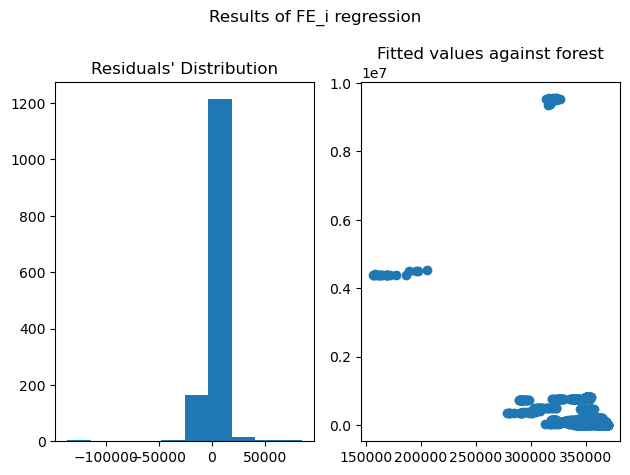

In [153]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of FE_i regression')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(fei_resid)
print(fei_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=fei_fit, y=test['forestM'])

plt.tight_layout()
plt.show()

In [154]:
fei_cov

,Intercept,sqrtcorn,sqrtgdp,Average_Temperature,cattleM
Intercept,4.885235e+08,-1.751648e+06,-34811.834339,-1.948841e+07,10025.964032
sqrtcorn,-1.751648e+06,7.446054e+03,52.896510,7.276251e+04,-84.511881
sqrtgdp,-3.481183e+04,5.289651e+01,96.040402,-3.648319e+03,25.307489
Average_Temperature,-1.948841e+07,7.276251e+04,-3648.318606,1.127756e+06,-2404.779744
cattleM,1.002596e+04,-8.451188e+01,25.307489,-2.404780e+03,13.238040


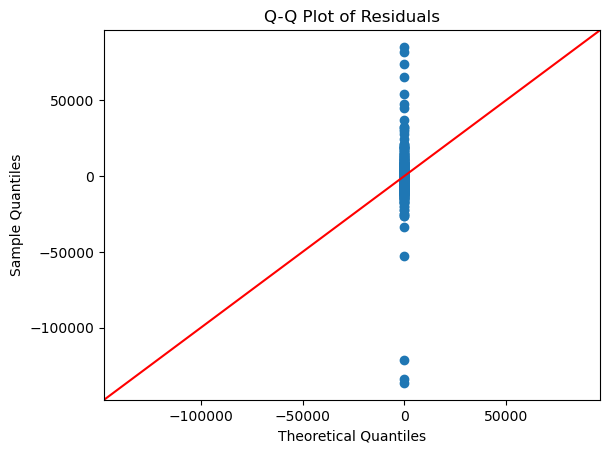

In [155]:
sm.qqplot(fei_resid, line='45')
plt.title('Q-Q Plot of Residuals')
#plt.xlim(-5,5)
plt.show()

In [156]:
stat, p_value = kstest(fei_resid, 'norm', args=(np.mean(fei_resid), np.std(fei_resid)))
print(f"Kolmogorov-Smirnov Test: p-value = {p_value}")


Kolmogorov-Smirnov Test: p-value = 3.1154751437558026e-80


In [157]:
stat, p_value = shapiro(fei_resid)
print(f"Shapiro-Wilk Test: p-value = {p_value}")
if p_value < 0.05:
    print("Reject the null hypothesis: Residuals are not normally distributed.")
else:
    print("Fail to reject the null hypothesis: Residuals are normally distributed.")


Shapiro-Wilk Test: p-value = 1.8448530665320713e-54
Reject the null hypothesis: Residuals are not normally distributed.


In [158]:
result = anderson(fei_resid, dist='norm')
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
for i in range(len(result.critical_values)):
    print(f"Significance Level {result.significance_level[i]}: Critical Value = {result.critical_values[i]}")


Anderson-Darling Test:
Statistic: 196.08257824268776
Significance Level 15.0: Critical Value = 0.574
Significance Level 10.0: Critical Value = 0.654
Significance Level 5.0: Critical Value = 0.785
Significance Level 2.5: Critical Value = 0.915
Significance Level 1.0: Critical Value = 1.089


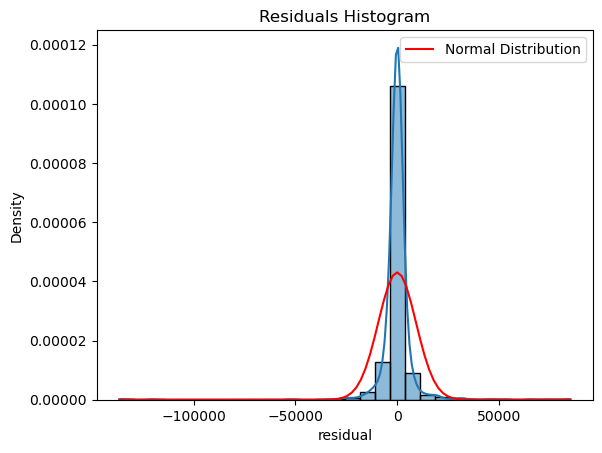

In [159]:
sns.histplot(fei_resid, kde=True, stat='density', bins=30)

# Overlay normal distribution
mu, std = np.mean(fei_resid), np.std(fei_resid)
x = np.linspace(min(fei_resid), max(fei_resid), 100)
plt.plot(x, stats.norm.pdf(x, mu, std), label='Normal Distribution', color='red')

plt.legend()
plt.title('Residuals Histogram')
plt.show()

## **$FE_t$**

In [161]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn + sqrtgdp + Average_Temperature + cattleM + TimeEffects",
                            data=test.set_index(["country", "year"]))
timeFixedEffects = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

fet_resid = timeFixedEffects.resids
fet_fit = timeFixedEffects.fitted_values
fet_cov = timeFixedEffects.cov

print(timeFixedEffects.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.3634
Estimator:                   PanelOLS   R-squared (Between):              0.3675
No. Observations:                1408   R-squared (Within):              -69.166
Date:                Tue, Dec 17 2024   R-squared (Overall):              0.3634
Time:                        13:32:54   Log-likelihood                -2.149e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      197.26
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(4,1382)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             13.247
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:640: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

5.4199085475589746


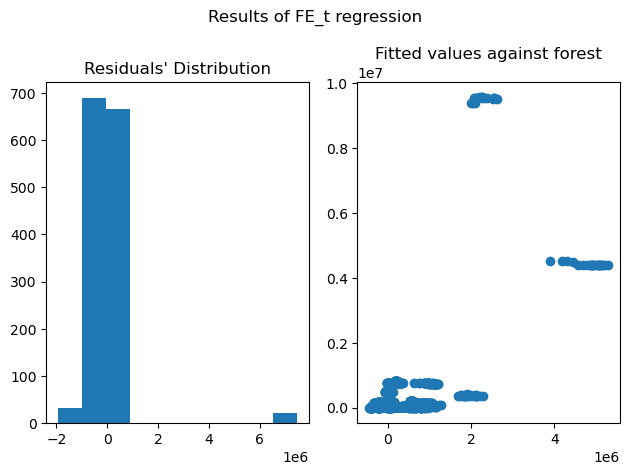

In [162]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of FE_t regression')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(fet_resid)
print(fet_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=fet_fit, y=test['forest'])

plt.tight_layout()
plt.show()

In [163]:
fet_cov

,Intercept,sqrtcorn,sqrtgdp,Average_Temperature,cattleM
Intercept,7.582046e+11,7.649722e+07,1.171094e+07,-3.845891e+10,2.195648e+07
sqrtcorn,7.649722e+07,1.338603e+06,-1.097045e+05,-5.690479e+06,-2.761470e+03
sqrtgdp,1.171094e+07,-1.097045e+05,6.381843e+04,-1.219983e+06,-4.654638e+02
Average_Temperature,-3.845891e+10,-5.690479e+06,-1.219983e+06,1.971861e+09,-1.107827e+06
cattleM,2.195648e+07,-2.761470e+03,-4.654638e+02,-1.107827e+06,9.078306e+02


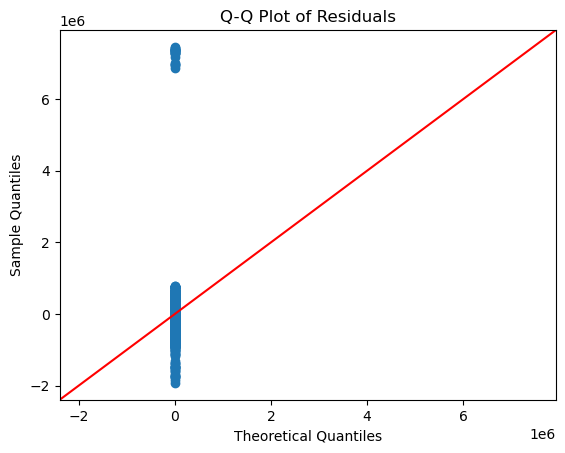

In [164]:
sm.qqplot(fet_resid, line='45')
plt.title('Q-Q Plot of Residuals')
#plt.xlim(-5,5)
plt.show()

In [165]:
stat, p_value = kstest(fet_resid, 'norm', args=(np.mean(fet_resid), np.std(fet_resid)))
print(f"Kolmogorov-Smirnov Test: p-value = {p_value}")


Kolmogorov-Smirnov Test: p-value = 4.606468808618116e-75


In [166]:
stat, p_value = shapiro(fet_resid)
print(f"Shapiro-Wilk Test: p-value = {p_value}")
if p_value < 0.05:
    print("Reject the null hypothesis: Residuals are not normally distributed.")
else:
    print("Fail to reject the null hypothesis: Residuals are normally distributed.")


Shapiro-Wilk Test: p-value = 1.0466867639728704e-52
Reject the null hypothesis: Residuals are not normally distributed.


In [167]:
result = anderson(fet_resid, dist='norm')
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
for i in range(len(result.critical_values)):
    print(f"Significance Level {result.significance_level[i]}: Critical Value = {result.critical_values[i]}")


Anderson-Darling Test:
Statistic: 138.07998288239014
Significance Level 15.0: Critical Value = 0.574
Significance Level 10.0: Critical Value = 0.654
Significance Level 5.0: Critical Value = 0.785
Significance Level 2.5: Critical Value = 0.915
Significance Level 1.0: Critical Value = 1.089


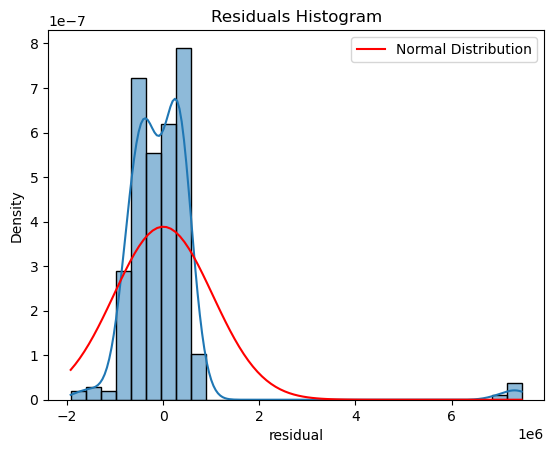

In [168]:
sns.histplot(fet_resid, kde=True, stat='density', bins=30)

# Overlay normal distribution
mu, std = np.mean(fet_resid), np.std(fet_resid)
x = np.linspace(min(fet_resid), max(fet_resid), 100)
plt.plot(x, stats.norm.pdf(x, mu, std), label='Normal Distribution', color='red')

plt.legend()
plt.title('Residuals Histogram')
plt.show()

## **$FE_{it}$**

In [170]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn + sqrtgdp + Average_Temperature + cattleM + EntityEffects + TimeEffects",
                            data=test.set_index(["country", "year"]))
fixedEffects = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

feit_resid = fixedEffects.resids
feit_fit = fixedEffects.fitted_values
feit_cov = fixedEffects.cov

print(fixedEffects.summary)

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.1185
Estimator:                   PanelOLS   R-squared (Between):             -0.0208
No. Observations:                1408   R-squared (Within):               0.0987
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.0207
Time:                        13:32:55   Log-likelihood                -1.485e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      44.348
Entities:                          64   P-value                           0.0000
Avg Obs:                       22.000   Distribution:                  F(4,1319)
Min Obs:                       22.000                                           
Max Obs:                       22.000   F-statistic (robust):             1.2614
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:680: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

-4.1562479813424815


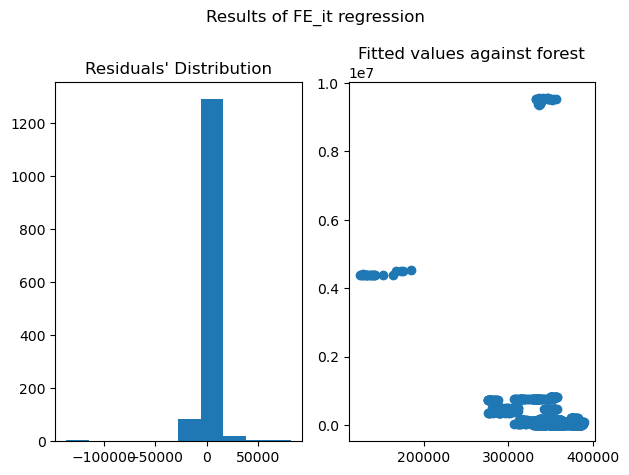

In [171]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of FE_it regression')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(feit_resid)
print(feit_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=feit_fit, y=test['forestM'])

plt.tight_layout()
plt.show()

In [172]:
feit_cov

,Intercept,sqrtcorn,sqrtgdp,Average_Temperature,cattleM
Intercept,1.028296e+09,-1.819542e+06,-386547.042787,-3.163802e+07,-59341.573638
sqrtcorn,-1.819542e+06,7.170533e+03,311.079758,6.605984e+04,-38.784355
sqrtgdp,-3.865470e+05,3.110798e+02,260.605977,8.631004e+03,40.037310
Average_Temperature,-3.163802e+07,6.605984e+04,8631.003505,1.137790e+06,760.111311
cattleM,-5.934157e+04,-3.878435e+01,40.037310,7.601113e+02,13.528908


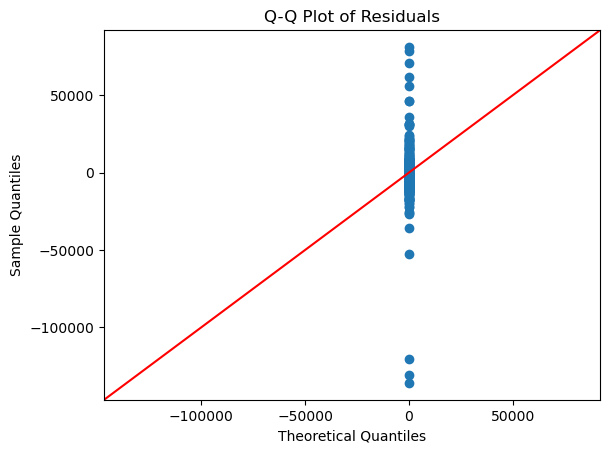

In [173]:
sm.qqplot(feit_resid, line='45')
plt.title('Q-Q Plot of Residuals')
#plt.xlim(-5,5)
plt.show()

In [174]:
stat, p_value = kstest(feit_resid, 'norm', args=(np.mean(feit_resid), np.std(feit_resid)))
print(f"Kolmogorov-Smirnov Test: p-value = {p_value}")


Kolmogorov-Smirnov Test: p-value = 6.1831721109980024e-77


In [175]:
stat, p_value = shapiro(feit_resid)
print(f"Shapiro-Wilk Test: p-value = {p_value}")
if p_value < 0.05:
    print("Reject the null hypothesis: Residuals are not normally distributed.")
else:
    print("Fail to reject the null hypothesis: Residuals are normally distributed.")


Shapiro-Wilk Test: p-value = 3.2691510390930614e-54
Reject the null hypothesis: Residuals are not normally distributed.


In [176]:
result = anderson(feit_resid, dist='norm')
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
for i in range(len(result.critical_values)):
    print(f"Significance Level {result.significance_level[i]}: Critical Value = {result.critical_values[i]}")


Anderson-Darling Test:
Statistic: 191.67203297830542
Significance Level 15.0: Critical Value = 0.574
Significance Level 10.0: Critical Value = 0.654
Significance Level 5.0: Critical Value = 0.785
Significance Level 2.5: Critical Value = 0.915
Significance Level 1.0: Critical Value = 1.089


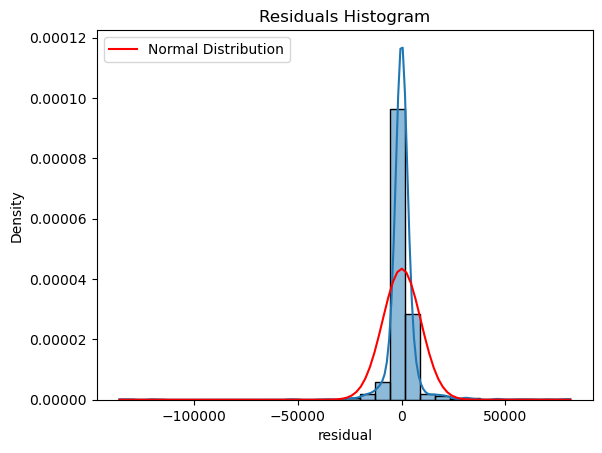

In [177]:
sns.histplot(feit_resid, kde=True, stat='density', bins=30)

# Overlay normal distribution
mu, std = np.mean(feit_resid), np.std(feit_resid)
x = np.linspace(min(feit_resid), max(feit_resid), 100)
plt.plot(x, stats.norm.pdf(x, mu, std), label='Normal Distribution', color='red')

plt.legend()
plt.title('Residuals Histogram')
plt.show()

## **$LAGGED CORN$**

In [179]:
test_lag = test
# Create the lagged variable for logcorn within each country
test_lag['sqrtcorn_lag1'] = test.groupby('country', observed=True)['sqrtcorn'].shift(-1)

# Drop 2021 rows
test_lag.dropna(inplace=True)
test_lag.head(22)

,country,year,forest,logforest,corn,logcorn,price,gdp,loggdp,Average_Temperature,...,wdi_gdpagr,sqrtforest,sqrtcorn,sqrtgdp,sqrtsuit,sqrtland,cattleM,sqrtgdpagr,forestM,sqrtcorn_lag1
23,Angola,2000,744712.4,13.520753,6868.53,8.834705,2.3175,12207.354573,9.409794,21.854977,...,32.0356,862.967207,82.876595,110.486898,195.337733,1116.557209,481.000,5.66,744712.4,86.323172
24,Angola,2001,745976.9,13.522450,7451.69,8.916196,2.0900,11948.601236,9.388369,21.870478,...,66.5856,863.699543,86.323172,109.309658,195.337733,1116.557209,492.000,8.16,745976.9,90.301052
25,Angola,2002,746276.4,13.522851,8154.28,9.006298,2.3575,15285.592487,9.634666,22.064162,...,34.1056,863.872907,90.301052,123.634916,195.337733,1116.557209,498.000,5.84,746276.4,90.467950
26,Angola,2003,747195.3,13.524082,8184.45,9.009991,2.4600,17812.704626,9.787667,22.212118,...,38.4400,864.404593,90.467950,133.464245,195.337733,1116.557209,498.000,6.20,747195.3,103.333054
27,Angola,2004,748742.9,13.526151,10677.72,9.275915,2.0475,23552.045850,10.066968,21.872386,...,39.0625,865.299312,103.333054,153.466758,195.337733,1116.557209,425.000,6.25,748742.9,104.415037
28,Angola,2005,750064.2,13.527914,10902.50,9.296747,2.1575,36970.878079,10.517886,22.432492,...,25.6036,866.062469,104.415037,192.278127,195.337733,1116.557209,498.000,5.06,750064.2,105.946024
29,Angola,2006,750107.6,13.527972,11224.56,9.325860,3.9025,52381.025105,10.866300,21.708688,...,26.9361,866.087524,105.946024,228.869013,195.337733,1116.557209,498.000,5.19,750107.6,109.993500
30,Angola,2007,749610.3,13.527309,12098.57,9.400843,4.5550,65266.415707,11.086233,22.083470,...,27.4576,865.800381,109.993500,255.472926,195.337733,1116.557209,540.000,5.24,749610.3,94.018243
31,Angola,2008,749901.4,13.527697,8839.43,9.086978,4.0700,88538.664888,11.391195,21.978362,...,23.1361,865.968475,94.018243,297.554474,195.337733,1116.557209,570.000,4.81,749901.4,121.115276
32,Angola,2009,751244.7,13.529487,14668.91,9.593486,4.1450,70307.193221,11.160629,22.249066,...,43.8244,866.743734,121.115276,265.155036,195.337733,1116.557209,575.000,6.62,751244.7,122.057978


In [180]:
'''test_lag = test
# Create the lagged variable for logcorn within each country
test_lag['forest_lag1'] = test.groupby('country', observed=True)['forest'].shift(-1)

# Drop 2021 rows
test_lag.dropna(inplace=True)
test_lag.head(22)'''

"test_lag = test\n# Create the lagged variable for logcorn within each country\ntest_lag['forest_lag1'] = test.groupby('country', observed=True)['forest'].shift(-1)\n\n# Drop 2021 rows\ntest_lag.dropna(inplace=True)\ntest_lag.head(22)"

In [181]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn_lag1 + sqrtgdp + Average_Temperature + cattleM + EntityEffects + TimeEffects",
                            data=test_lag.set_index(["country", "year"]))
lagFE = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

felag_resid = lagFE.resids
felag_fit = lagFE.fitted_values
felag_cov = lagFE.cov

print(lagFE.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.1534
Estimator:                   PanelOLS   R-squared (Between):             -0.0225
No. Observations:                1344   R-squared (Within):               0.1250
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.0225
Time:                        13:32:57   Log-likelihood                -1.406e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      56.903
Entities:                          64   P-value                           0.0000
Avg Obs:                       21.000   Distribution:                  F(4,1256)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):             1.4766
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

-4.100798259838445


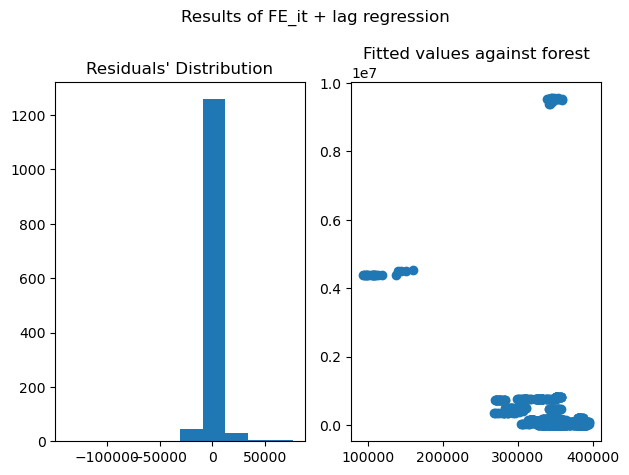

In [182]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of FE_it + lag regression')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(felag_resid)
print(felag_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=felag_fit, y=test['forestM'])

plt.tight_layout()
plt.show()

In [183]:
felag_cov

,Intercept,sqrtcorn_lag1,sqrtgdp,Average_Temperature,cattleM
Intercept,1.317906e+09,-1.985411e+06,-353726.116168,-4.672241e+07,-63998.116925
sqrtcorn_lag1,-1.985411e+06,5.294368e+03,213.786975,7.838232e+04,12.732945
sqrtgdp,-3.537261e+05,2.137870e+02,227.645174,7.888559e+03,41.511642
Average_Temperature,-4.672241e+07,7.838232e+04,7888.559430,1.905931e+06,825.001415
cattleM,-6.399812e+04,1.273295e+01,41.511642,8.250014e+02,13.162348


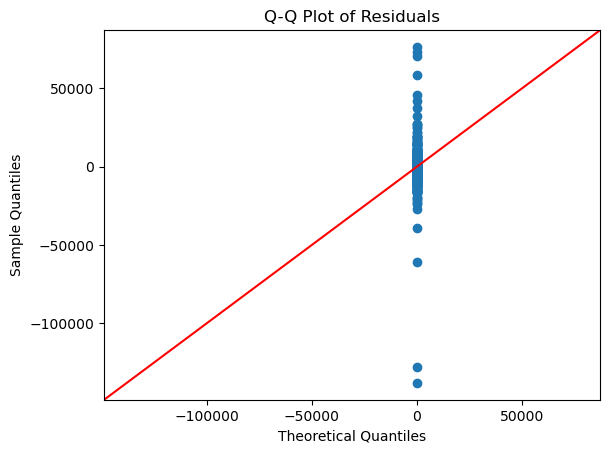

In [184]:
sm.qqplot(felag_resid, line='45')
plt.title('Q-Q Plot of Residuals')
#plt.xlim(-5,5)
plt.show()

In [185]:
stat, p_value = kstest(felag_resid, 'norm', args=(np.mean(felag_resid), np.std(felag_resid)))
print(f"Kolmogorov-Smirnov Test: p-value = {p_value}")


Kolmogorov-Smirnov Test: p-value = 4.808644242109482e-72


In [186]:
stat, p_value = shapiro(felag_resid)
print(f"Shapiro-Wilk Test: p-value = {p_value}")
if p_value < 0.05:
    print("Reject the null hypothesis: Residuals are not normally distributed.")
else:
    print("Fail to reject the null hypothesis: Residuals are normally distributed.")


Shapiro-Wilk Test: p-value = 1.1108177515651684e-52
Reject the null hypothesis: Residuals are not normally distributed.


In [187]:
result = anderson(felag_resid, dist='norm')
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
for i in range(len(result.critical_values)):
    print(f"Significance Level {result.significance_level[i]}: Critical Value = {result.critical_values[i]}")


Anderson-Darling Test:
Statistic: 169.94593403220915
Significance Level 15.0: Critical Value = 0.574
Significance Level 10.0: Critical Value = 0.654
Significance Level 5.0: Critical Value = 0.785
Significance Level 2.5: Critical Value = 0.915
Significance Level 1.0: Critical Value = 1.089


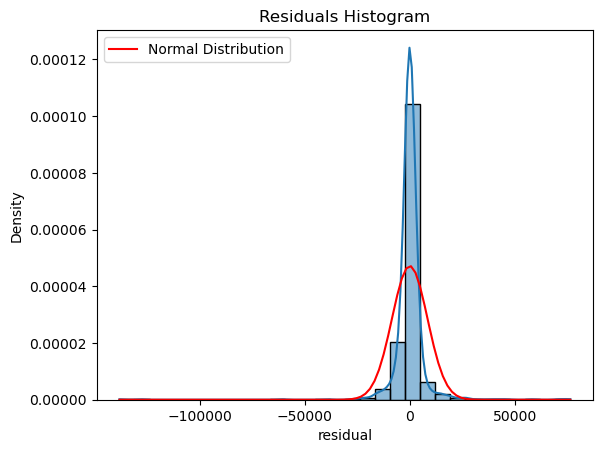

In [188]:
sns.histplot(felag_resid, kde=True, stat='density', bins=30)

# Overlay normal distribution
mu, std = np.mean(felag_resid), np.std(felag_resid)
x = np.linspace(min(felag_resid), max(felag_resid), 100)
plt.plot(x, stats.norm.pdf(x, mu, std), label='Normal Distribution', color='red')

plt.legend()
plt.title('Residuals Histogram')
plt.show()

## **$IV$**

In [190]:
from linearmodels import IV2SLS

In [191]:
np.cov(test['sqrtcorn'], test['cattleM'])

array([[5.17380511e+03, 2.35735237e+05],
       [2.35735237e+05, 2.74107775e+07]])

In [192]:
est_fe_canned = IV2SLS.from_formula("forestM ~ 1 + [sqrtcorn ~ price] + sqrtgdp + sqrtgdpagr + Average_Temperature + cattleM",
                            data=test.set_index(["country", "year"]))
result = est_fe_canned.fit(cov_type='clustered', clusters=test.set_index(["country", "year"]).index.get_level_values('country'))

print(result.summary)

                          IV-2SLS Estimation Summary                          
Dep. Variable:                forestM   R-squared:                      0.3582
Estimator:                    IV-2SLS   Adj. R-squared:                 0.3558
No. Observations:                1344   F-statistic:                    83.726
Date:                Tue, Dec 17 2024   P-value (F-stat)                0.0000
Time:                        13:32:59   Distribution:                  chi2(5)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept            7.909e+05  7.832e+05     1.0098     0.3126  -7.442e+05   2.326e+06
sqrtgdp         

In [193]:
test.keys()

Index(['country', 'year', 'forest', 'logforest', 'corn', 'logcorn', 'price',
       'gdp', 'loggdp', 'Average_Temperature', 'rain', 'wdi_poprul', 'bci_bci',
       'suitability', 'logsuit', 'landArea', 'logland', 'hetero', 'cattle',
       'wdi_fdiin', 'wdi_gdpagr', 'sqrtforest', 'sqrtcorn', 'sqrtgdp',
       'sqrtsuit', 'sqrtland', 'cattleM', 'sqrtgdpagr', 'forestM',
       'sqrtcorn_lag1'],
      dtype='object')

In [194]:
test['hetero'].describe()

count    1344.000000
mean        0.500000
std         0.500186
min         0.000000
25%         0.000000
50%         0.500000
75%         1.000000
max         1.000000
Name: hetero, dtype: float64

<Figure size 640x480 with 0 Axes>

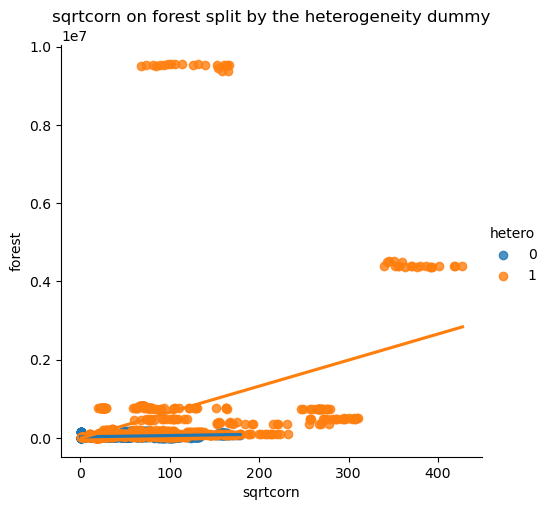

In [195]:
plt.figure()

sns.lmplot(data=test,
          x='sqrtcorn',
          y='forest',
          hue='hetero',
          ci=None)

plt.title('sqrtcorn on forest split by the heterogeneity dummy')
#plt.xlim(-5,5000)
plt.show()

In [196]:
test['sqrtcornhetero'] = test['sqrtcorn']*test['hetero']

In [197]:
est_fe_canned = PanelOLS.from_formula("forestM ~ 1 + sqrtcorn_lag1 + sqrtgdp + Average_Temperature + cattleM + sqrtcornhetero + EntityEffects + TimeEffects",
                            data=test_lag.set_index(["country", "year"]))
feLagHetero = est_fe_canned.fit(cov_type='clustered', cluster_entity=True)

felaghetero_resid = feLagHetero.resids
felaghetero_fit = feLagHetero.fitted_values
felaghetero_cov = feLagHetero.cov

print(feLagHetero.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                forestM   R-squared:                        0.1613
Estimator:                   PanelOLS   R-squared (Between):             -0.0254
No. Observations:                1344   R-squared (Within):               0.1302
Date:                Tue, Dec 17 2024   R-squared (Overall):             -0.0254
Time:                        13:33:00   Log-likelihood                -1.405e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      48.284
Entities:                          64   P-value                           0.0000
Avg Obs:                       21.000   Distribution:                  F(5,1255)
Min Obs:                       21.000                                           
Max Obs:                       21.000   F-statistic (robust):             1.2624
                            

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel\data.py:590: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\simon\anaconda3\Lib\site-packages\linearmodels\panel

-4.122144169066566


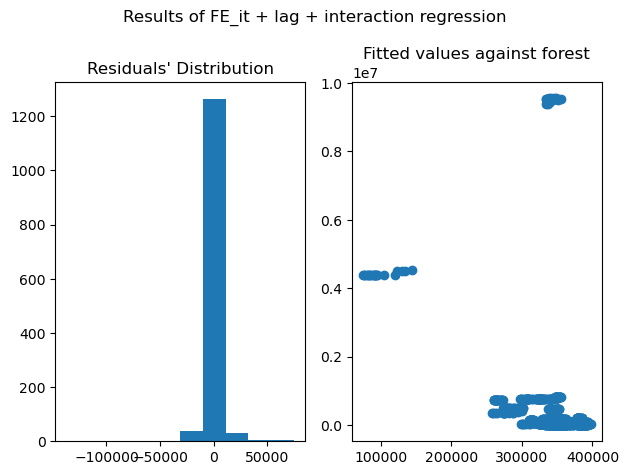

In [198]:
fig, axs = plt.subplots(1,2)

fig.suptitle('Results of FE_it + lag + interaction regression')

axs[0].set_title("Residuals' Distribution")
axs[0].hist(felaghetero_resid)
print(felaghetero_resid.skew())


axs[1].set_title('Fitted values against forest')
axs[1].scatter(x=felaghetero_fit, y=test['forestM'])

plt.tight_layout()
plt.show()

In [199]:
felaghetero_cov

,Intercept,sqrtcorn_lag1,sqrtgdp,Average_Temperature,cattleM,sqrtcornhetero
Intercept,1.247511e+09,-612545.993083,-330576.427914,-4.457509e+07,-64224.412962,-1.681639e+06
sqrtcorn_lag1,-6.125460e+05,1678.162809,-57.648788,3.079176e+04,-36.975975,3.833752e+02
sqrtgdp,-3.305764e+05,-57.648788,224.024282,7.177717e+03,40.552935,2.931201e+02
Average_Temperature,-4.457509e+07,30791.762246,7177.717214,1.834290e+06,897.996881,5.933761e+04
cattleM,-6.422441e+04,-36.975975,40.552935,8.979969e+02,12.975988,7.019147e+01
sqrtcornhetero,-1.681639e+06,383.375241,293.120130,5.933761e+04,70.191466,5.249326e+03


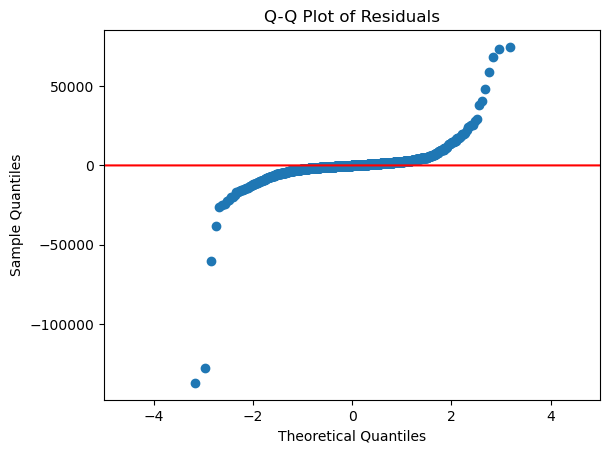

In [200]:
sm.qqplot(felaghetero_resid, line='45')
plt.title('Q-Q Plot of Residuals')
plt.xlim(-5,5)
plt.show()

In [201]:
stat, p_value = kstest(felaghetero_resid, 'norm', args=(np.mean(felaghetero_resid), np.std(felaghetero_resid)))
print(f"Kolmogorov-Smirnov Test: p-value = {p_value}")


Kolmogorov-Smirnov Test: p-value = 1.2733849543175034e-72


In [202]:
stat, p_value = shapiro(felaghetero_resid)
print(f"Shapiro-Wilk Test: p-value = {p_value}")
if p_value < 0.05:
    print("Reject the null hypothesis: Residuals are not normally distributed.")
else:
    print("Fail to reject the null hypothesis: Residuals are normally distributed.")


Shapiro-Wilk Test: p-value = 1.2075671178752676e-52
Reject the null hypothesis: Residuals are not normally distributed.


In [203]:
result = anderson(felaghetero_resid, dist='norm')
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
for i in range(len(result.critical_values)):
    print(f"Significance Level {result.significance_level[i]}: Critical Value = {result.critical_values[i]}")


Anderson-Darling Test:
Statistic: 171.34367416161012
Significance Level 15.0: Critical Value = 0.574
Significance Level 10.0: Critical Value = 0.654
Significance Level 5.0: Critical Value = 0.785
Significance Level 2.5: Critical Value = 0.915
Significance Level 1.0: Critical Value = 1.089


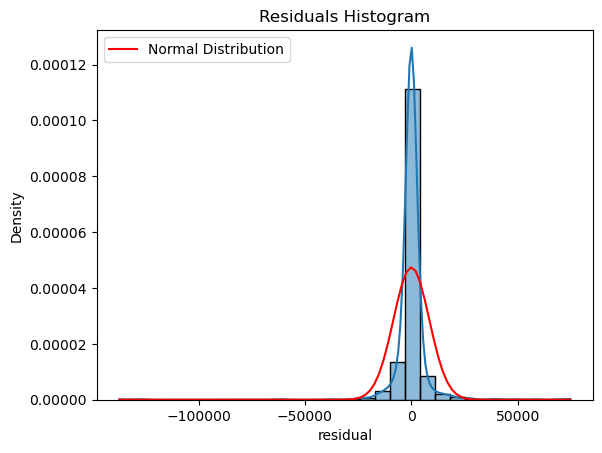

In [204]:
sns.histplot(felaghetero_resid, kde=True, stat='density', bins=30)

# Overlay normal distribution
mu, std = np.mean(felaghetero_resid), np.std(felaghetero_resid)
x = np.linspace(min(felaghetero_resid), max(felaghetero_resid), 100)
plt.plot(x, stats.norm.pdf(x, mu, std), label='Normal Distribution', color='red')

plt.legend()
plt.title('Residuals Histogram')
plt.show()

# **HETEROGENEITY**

## **Mise en forme**

In [207]:
#pip install stargazer

In [208]:
#pip install jupyterlab-mathjax3

In [209]:
#pip install nbconvert

In [210]:
#pip install notebook jupyterlab

In [211]:
from stargazer.stargazer import Stargazer
from IPython.display import display, Latex
from IPython.core.display import display, HTML

C:\Users\simon\AppData\Local\Temp\ipykernel_14988\1072346743.py:3: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [212]:
html_code = Stargazer([baseline, fixedEffects, lagFE, feLagHetero]).render_html()
display(HTML(html_code))

In [213]:
print(np.cov([test['sqrtcorn'], test['Average_Temperature'], test['sqrtgdp'], test['cattleM']]).round(2))

[[ 5.17381000e+03  2.91000000e+01  1.36748600e+04  2.35735240e+05]
 [ 2.91000000e+01  5.56200000e+01 -1.01799000e+03 -1.48435000e+03]
 [ 1.36748600e+04 -1.01799000e+03  1.68444940e+05  9.98804620e+05]
 [ 2.35735240e+05 -1.48435000e+03  9.98804620e+05  2.74107775e+07]]


In [214]:
feLagHetero.resids.mean()

-7.0161019851054465e-12

In [215]:
print(np.cov([feLagHetero.resids, test['sqrtcorn'], test['Average_Temperature'], test['sqrtgdp'], test['cattleM']]))

[[ 7.08666181e+07  1.76688504e+03 -3.81405373e-10  1.24601668e-08
   9.13597627e-08]
 [ 1.76688504e+03  5.17380511e+03  2.90950604e+01  1.36748623e+04
   2.35735237e+05]
 [-3.81405373e-10  2.90950604e+01  5.56181293e+01 -1.01798988e+03
  -1.48434604e+03]
 [ 1.24601668e-08  1.36748623e+04 -1.01798988e+03  1.68444943e+05
   9.98804620e+05]
 [ 9.13597627e-08  2.35735237e+05 -1.48434604e+03  9.98804620e+05
   2.74107775e+07]]


In [216]:
from statsmodels.stats.stattools import durbin_watson
dw_stat = durbin_watson(feLagHetero.resids)
print("Durbin-Watson statistic:", dw_stat)

Durbin-Watson statistic: 0.577772589958809
